In [2]:
import numpy as np
import pandas as pd
import os
import math
from pprint import pprint
from collections import defaultdict
import seq_helper as seqh
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import pairwise_distances
from scipy.spatial.distance import squareform, pdist
from sklearn.manifold.t_sne import (_joint_probabilities,
                                    _kl_divergence)

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
    
from matplotlib.cm import spectral
import matplotlib.pyplot as plt
import matplotlib as mpl

from numpy.linalg import norm
from numpy.linalg import eigh

import seq_helper as seqh

import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5,
                rc={"lines.linewidth": 2.5})

import maxflow
import itertools as it


from sklearn.cluster.bicluster import SpectralBiclustering
from sklearn.metrics import consensus_score
from sklearn.cluster.bicluster import SpectralCoclustering

In [3]:
F_path_name = ''.join(['./matrix_data/','F_with_norm.csv'])
Q_path_name = ''.join(['./matrix_data/','Q.csv'])
L_path_name = ''.join(['./matrix_data/','L.csv'])

F = np.array(pd.read_csv(F_path_name,sep=",", header = None))
Q = np.array(pd.read_csv(Q_path_name,sep=",", header = None))
L = np.array(pd.read_csv(L_path_name,sep=",", header = None))
L = np.reshape(L.astype(int),(-1))
print(F.shape)
L_limit = 174 # after 174 the label changes

data_num = F.shape[0]
F.shape, Q.shape, L.shape, data_num

Len_path_name = ''.join(['./matrix_data/','fragLenOutput.txt'])
Len = np.array(pd.read_csv(Len_path_name,sep="\t", header = None))
Len = np.array(Len[:,1:]).astype(np.float)
Len_n = np.zeros_like(Len)
for i in range(data_num):
    den = np.sum(Len[i,:])
    Len_n[i,:] = (Len[i,:]+1)/(den+Len_n.shape[1])        

(359, 256)


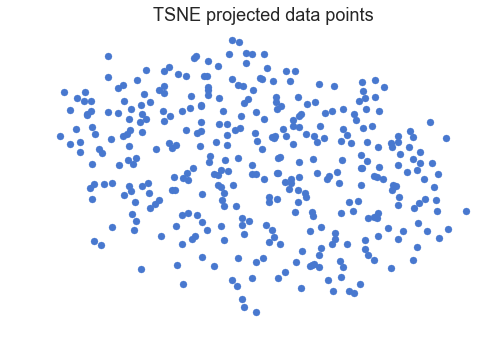

In [50]:
# TSNE
perplexity = 30.0
nc = 2
tsne = TSNE(n_components=nc, perplexity=perplexity,random_state=0)
F_reduced = tsne.fit_transform(F)

#for i in label draw
plt.figure(figsize = (20,20))
fig, ax = plt.subplots()
c=[spectral(float(i) /nc) for i in L]
ax.scatter(F_reduced[:,0],F_reduced[:,1])

#txt = [str(i) for i in range(data_num)] #[label_text_dict[i] for i in label]
#for i in range(data_num):
#    ax.annotate(txt[i], (F_reduced[i,0],F_reduced[i,1]),size=9)

plt.axis('off')
plt.aspect='equal'
plt.title('TSNE projected data points')
plt.show()

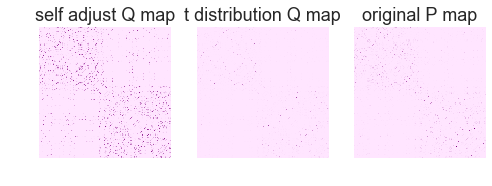

In [35]:
DL_map = pairwise_distances(F_reduced, squared=True)
Q_map_binary = _joint_probabilities(DL_map, perplexity, False)

Q_map_p = squareform(Q_map_binary)
pal = sns.light_palette("purple", as_cmap=True)

plt.subplot(131)
plt.imshow(Q_map_p, interpolation='None', cmap=pal)
plt.axis('off'), plt.title('self adjust Q map')

plt.subplot(132)
Q_map_t = seqh.convert_Y_to_Q_by_t_dist(F_reduced)

plt.imshow(Q_map_t, interpolation='None', cmap=pal)
plt.axis('off'), plt.title('t distribution Q map')

plt.subplot(133)
DH_map = pairwise_distances(F, squared=True)
P_map_binary = _joint_probabilities(DH_map, perplexity, False)

P_map = squareform(P_map_binary)
#P_map = _joint_probabilities_constant_sigma(D_map, 0.01)

plt.imshow(P_map, interpolation='None', cmap=pal)
plt.axis('off'), plt.title('original P map')
plt.show()


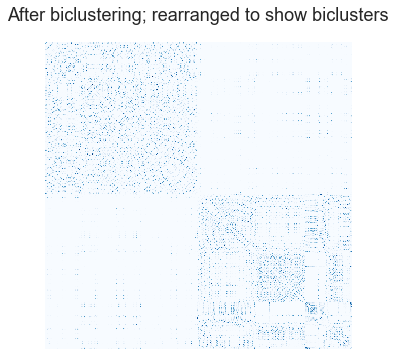

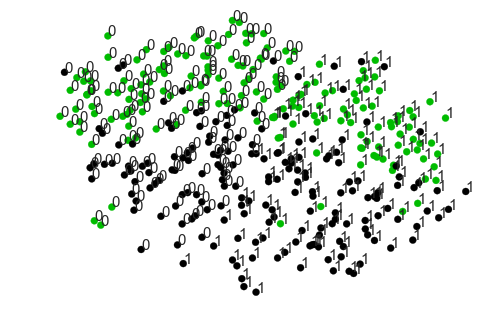

In [36]:
nc = 2
the_map = Q_map_p
model = SpectralCoclustering(n_clusters=nc, random_state=10000)
model.fit(the_map)

fit_data = the_map[np.argsort(model.row_labels_)]
fit_data = fit_data[:, np.argsort(model.column_labels_)]

plt.matshow(fit_data, cmap=plt.cm.Blues)
plt.title("After biclustering; rearranged to show biclusters")
plt.axis('off')
plt.show()

fig, ax = plt.subplots()
c=[spectral(float(i) /nc) for i in L]
ax.scatter(F_reduced[:,0],F_reduced[:,1], c=c)
txt = [str(i) for i in model.row_labels_] #[label_text_dict[i] for i in label]
for i in range(data_num):
    ax.annotate(txt[i], (F_reduced[i,0],F_reduced[i,1]),size=15)
plt.axis('off')
plt.show()

In [52]:
lamb = 0.13       # boost region 
is_add_hard_constraint = True
N_neighbor = 15
K_upper_limit = 100*lamb

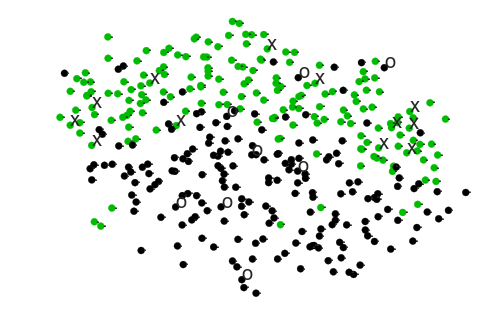

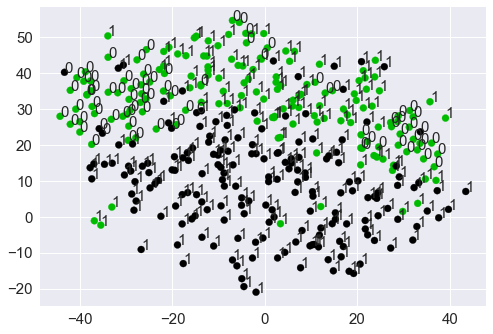

num of points  20 fore_nodes  12 back_nodes  8
Maximum flow is  1.1429782855560493 acc is  0.710306406685


C:\Users\xbw\Anaconda3\envs\tensorflow\lib\site-packages\sklearn\cluster\k_means_.py:889: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  return_n_iter=True)


kmeans acc  0.682451253482


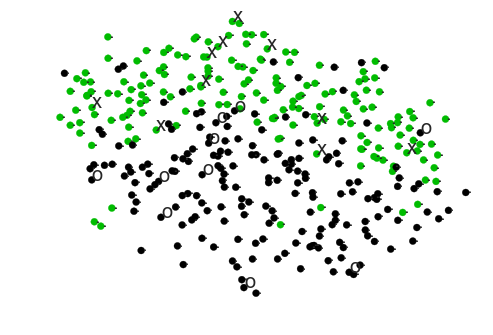

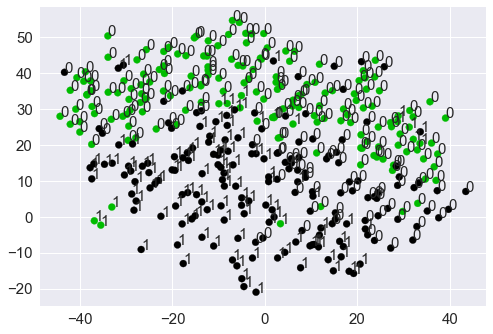

num of points  20 fore_nodes  10 back_nodes  10
Maximum flow is  1.1430214572304496 acc is  0.74651810585
kmeans acc  0.793871866295


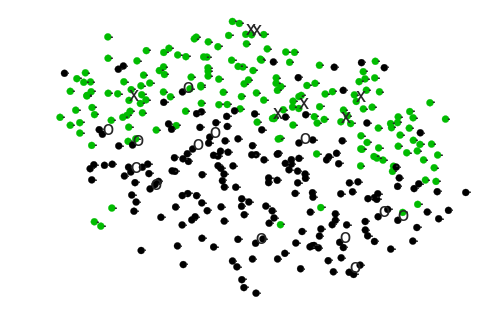

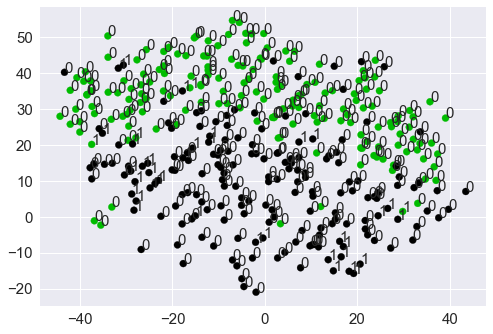

num of points  20 fore_nodes  7 back_nodes  13
Maximum flow is  1.1371754187863226 acc is  0.573816155989
kmeans acc  0.799442896936


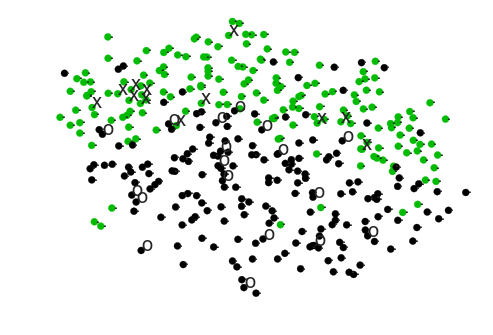

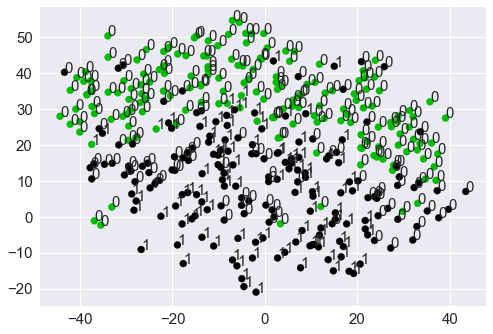

num of points  30 fore_nodes  12 back_nodes  18
Maximum flow is  1.0914341200860063 acc is  0.757660167131
kmeans acc  0.827298050139


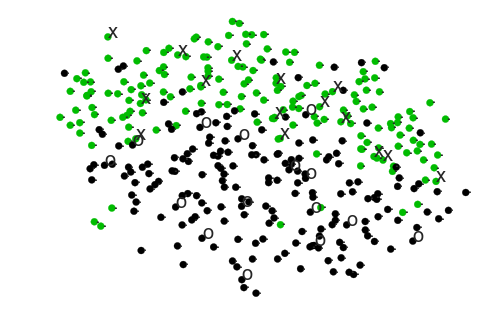

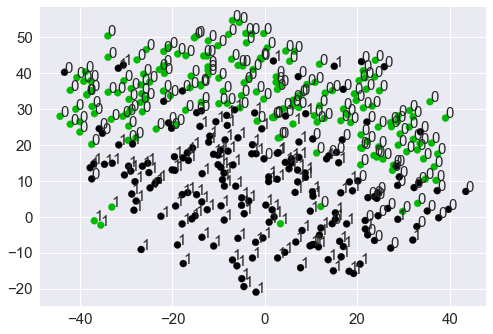

num of points  30 fore_nodes  15 back_nodes  15
Maximum flow is  1.0916370445618693 acc is  0.860724233983
kmeans acc  0.799442896936


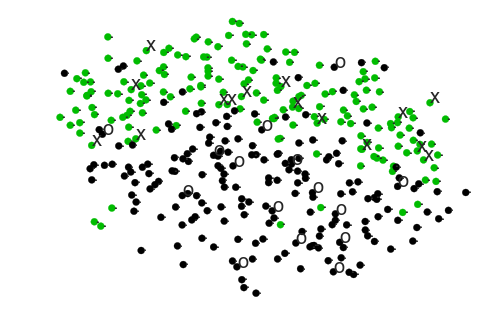

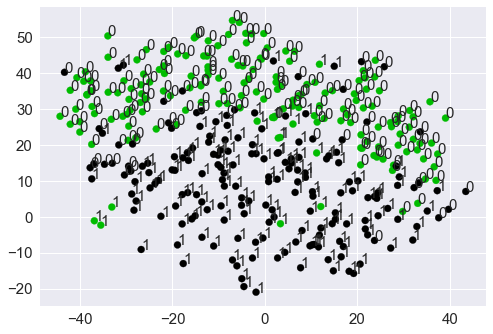

num of points  30 fore_nodes  15 back_nodes  15
Maximum flow is  1.0922085070688003 acc is  0.871866295265
kmeans acc  0.838440111421


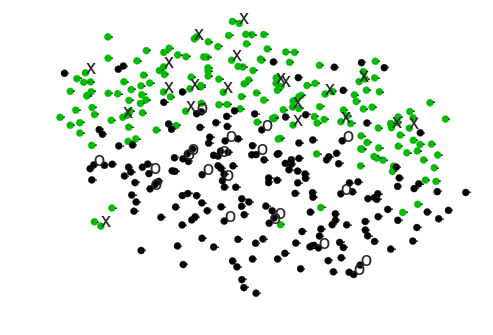

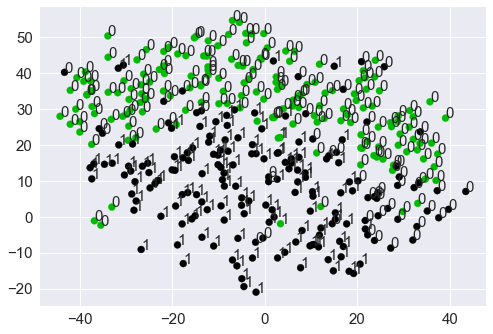

num of points  40 fore_nodes  20 back_nodes  20
Maximum flow is  1.041710995189733 acc is  0.857938718663
kmeans acc  0.844011142061


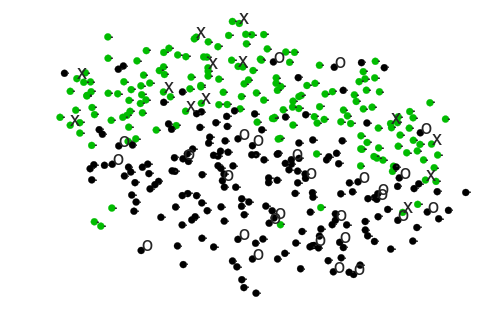

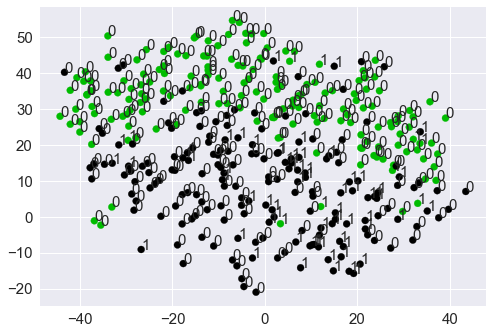

num of points  40 fore_nodes  13 back_nodes  27
Maximum flow is  1.038021696131783 acc is  0.646239554318
kmeans acc  0.802228412256


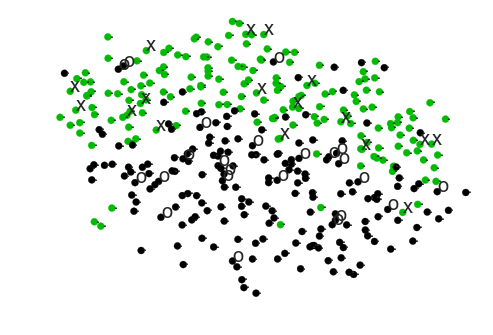

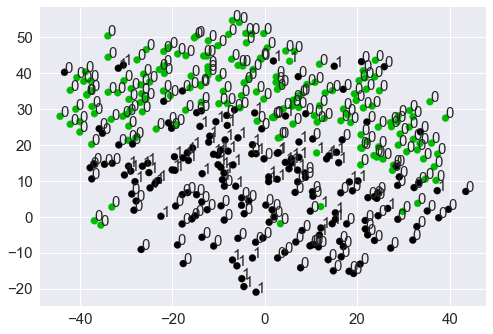

num of points  40 fore_nodes  17 back_nodes  23
Maximum flow is  1.0414366029083586 acc is  0.688022284123
kmeans acc  0.818941504178


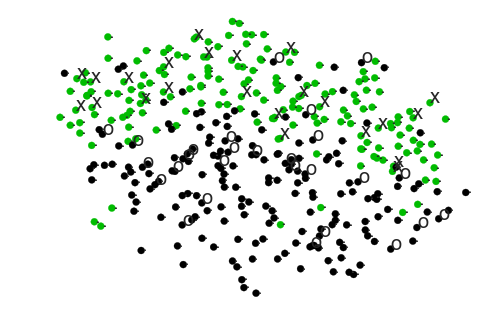

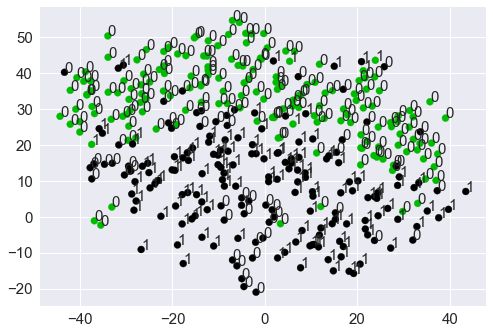

num of points  50 fore_nodes  23 back_nodes  27
Maximum flow is  0.9947500345343983 acc is  0.841225626741
kmeans acc  0.857938718663


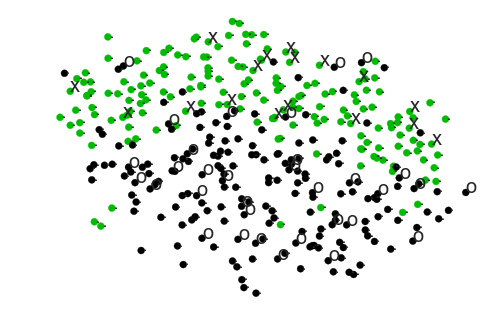

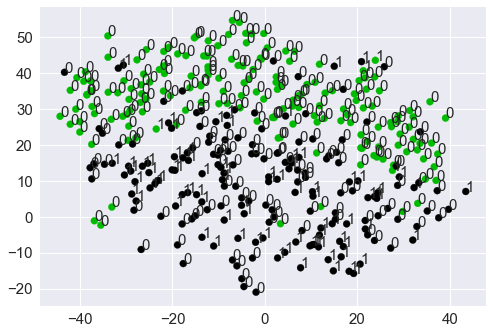

num of points  50 fore_nodes  17 back_nodes  33
Maximum flow is  0.9944284072399971 acc is  0.715877437326
kmeans acc  0.880222841226


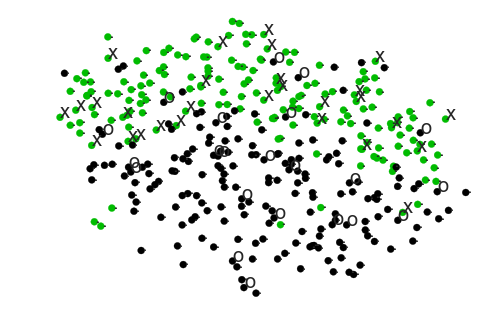

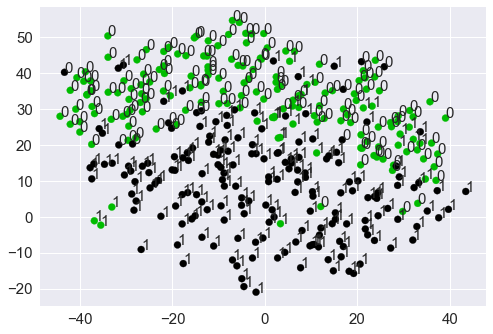

num of points  50 fore_nodes  28 back_nodes  22
Maximum flow is  0.9986438420351692 acc is  0.899721448468
kmeans acc  0.805013927577


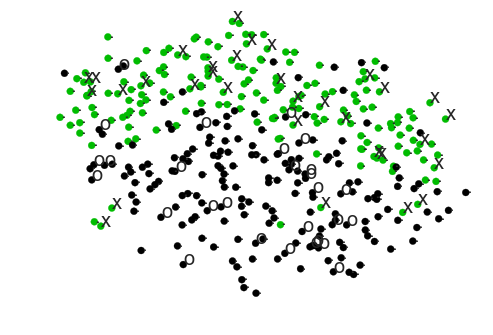

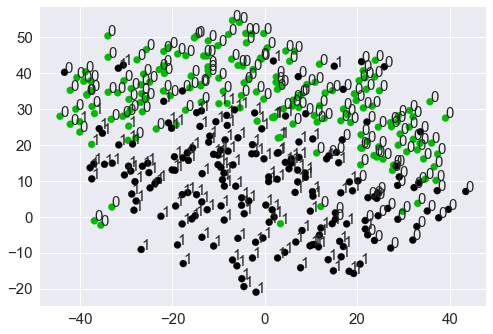

num of points  60 fore_nodes  32 back_nodes  28
Maximum flow is  0.9480570203557367 acc is  0.849582172702
kmeans acc  0.863509749304


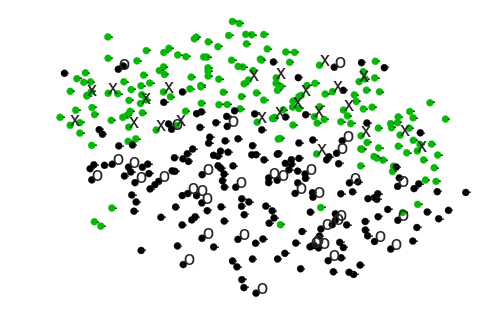

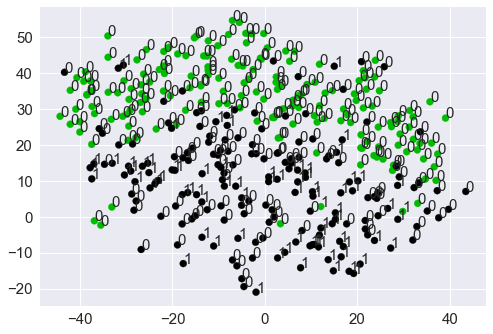

num of points  60 fore_nodes  23 back_nodes  37
Maximum flow is  0.950651891901276 acc is  0.704735376045
kmeans acc  0.866295264624


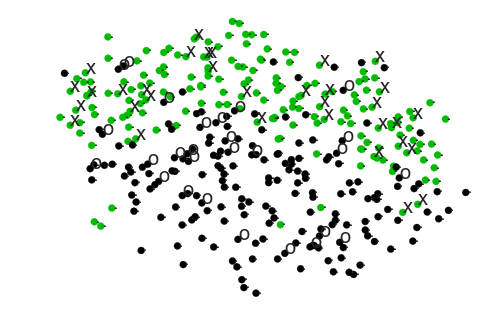

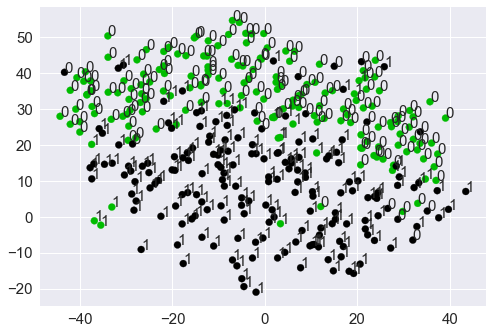

num of points  60 fore_nodes  33 back_nodes  27
Maximum flow is  0.9570898397739696 acc is  0.905292479109
kmeans acc  0.894150417827


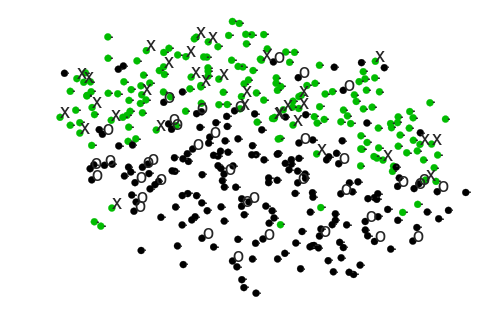

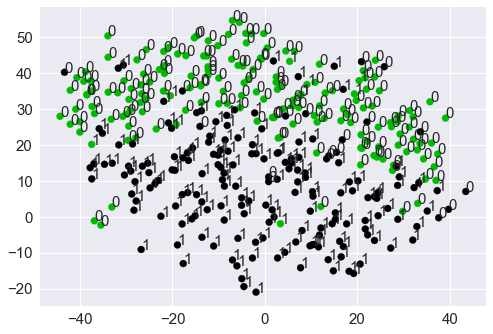

num of points  70 fore_nodes  32 back_nodes  38
Maximum flow is  0.9091207964148165 acc is  0.924791086351
kmeans acc  0.908077994429


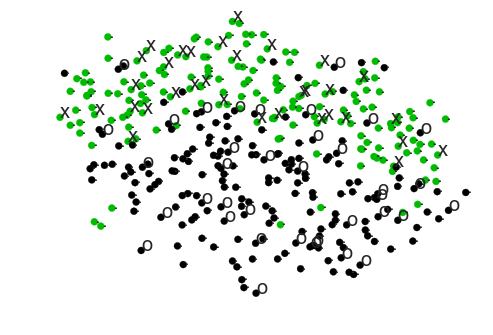

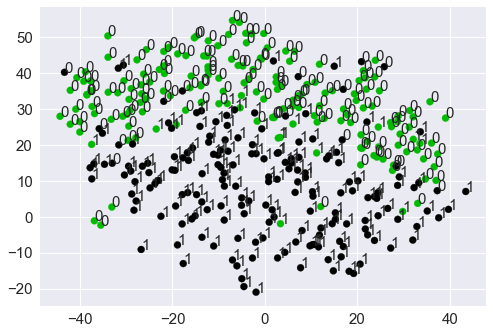

num of points  70 fore_nodes  33 back_nodes  37
Maximum flow is  0.9110951209563559 acc is  0.91922005571
kmeans acc  0.866295264624


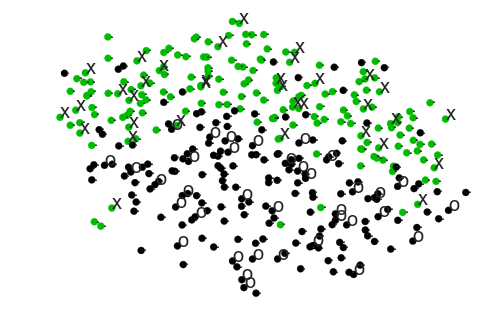

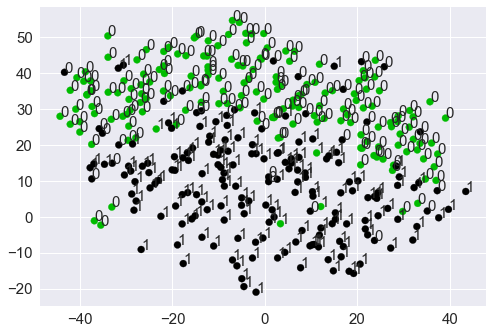

num of points  70 fore_nodes  34 back_nodes  36
Maximum flow is  0.9023834355171239 acc is  0.910863509749
kmeans acc  0.908077994429


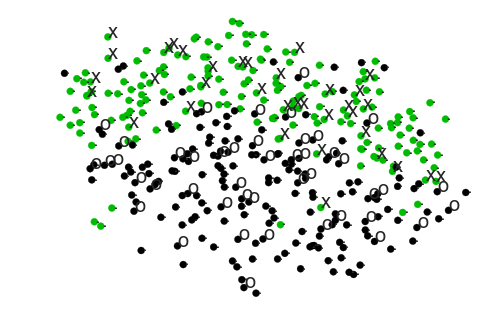

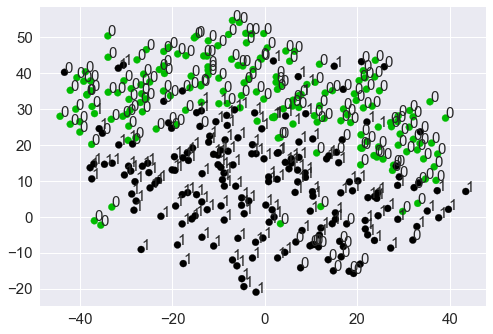

num of points  80 fore_nodes  35 back_nodes  45
Maximum flow is  0.869747653077305 acc is  0.869080779944
kmeans acc  0.891364902507


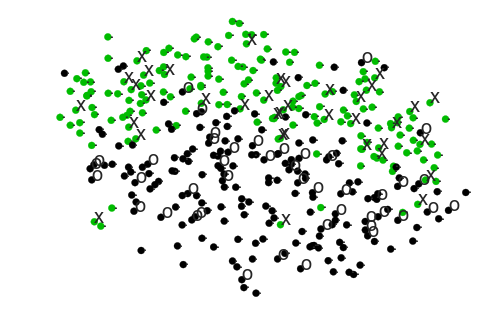

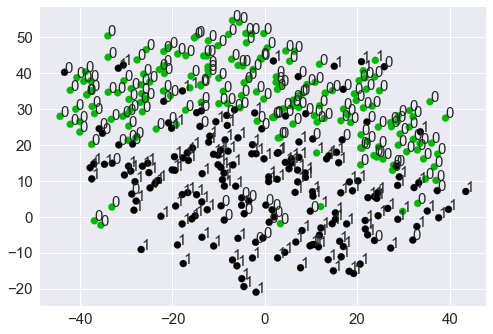

num of points  80 fore_nodes  37 back_nodes  43
Maximum flow is  0.861964266127487 acc is  0.874651810585
kmeans acc  0.905292479109


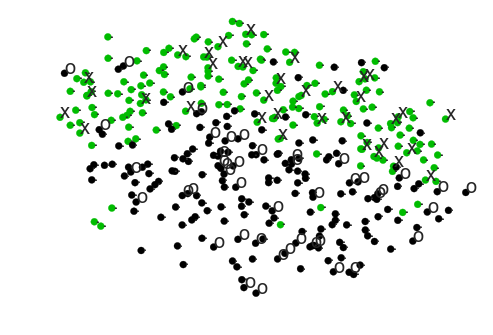

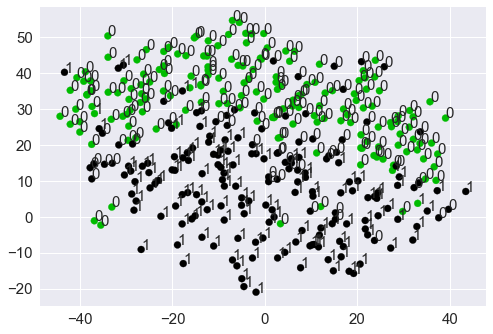

num of points  80 fore_nodes  35 back_nodes  45
Maximum flow is  0.8575904816332415 acc is  0.844011142061
kmeans acc  0.888579387187


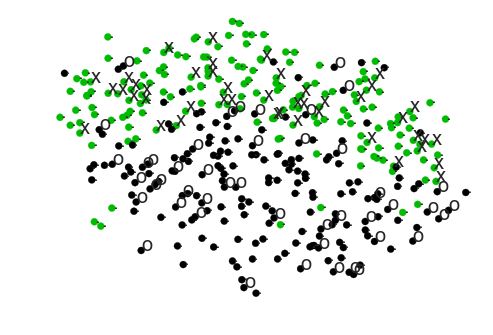

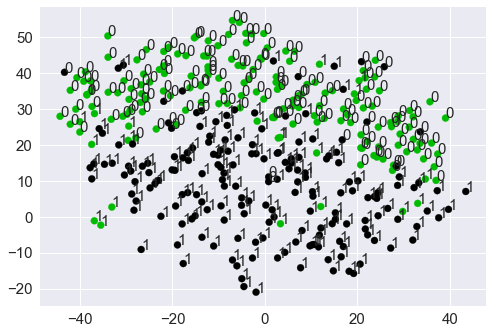

num of points  90 fore_nodes  44 back_nodes  46
Maximum flow is  0.8231043107053734 acc is  0.894150417827
kmeans acc  0.899721448468


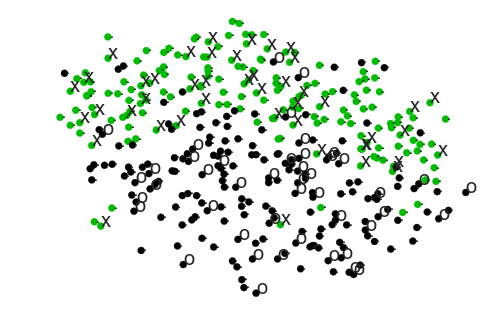

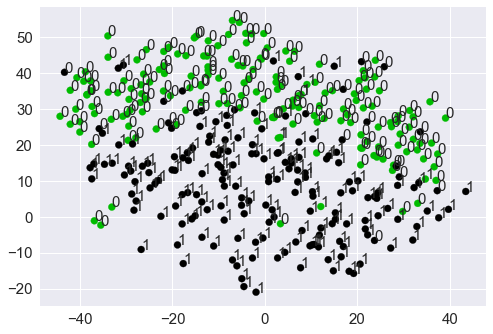

num of points  90 fore_nodes  45 back_nodes  45
Maximum flow is  0.8255967326870011 acc is  0.924791086351
kmeans acc  0.896935933148


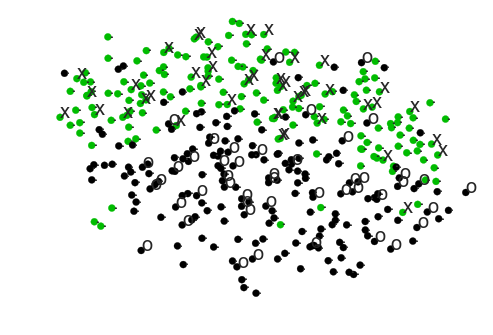

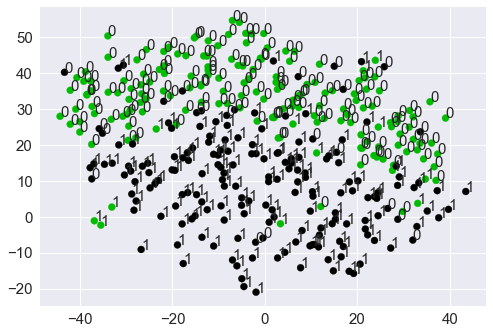

num of points  90 fore_nodes  44 back_nodes  46
Maximum flow is  0.8184975701310223 acc is  0.899721448468
kmeans acc  0.885793871866


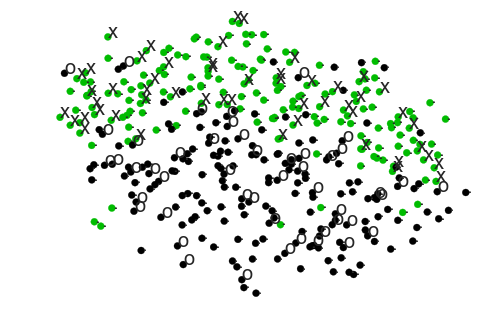

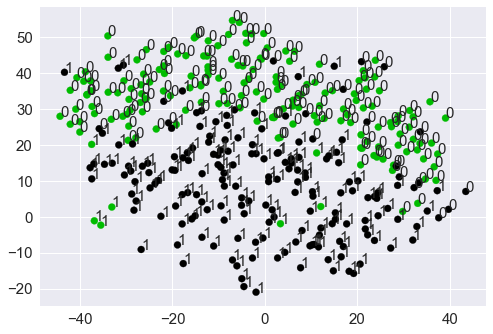

num of points  100 fore_nodes  52 back_nodes  48
Maximum flow is  0.7780953717352481 acc is  0.922005571031
kmeans acc  0.905292479109


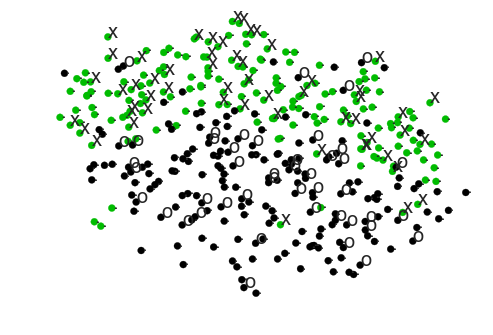

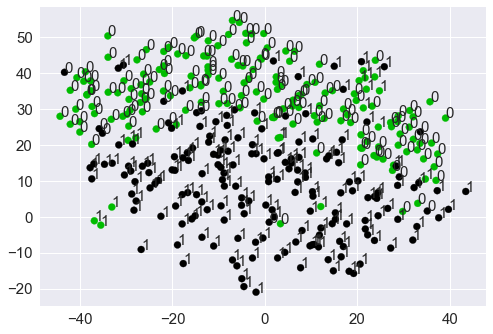

num of points  100 fore_nodes  55 back_nodes  45
Maximum flow is  0.7907638661468797 acc is  0.910863509749
kmeans acc  0.857938718663


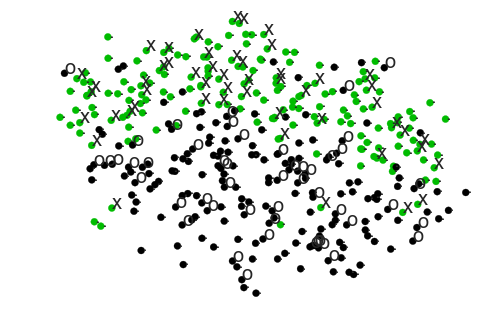

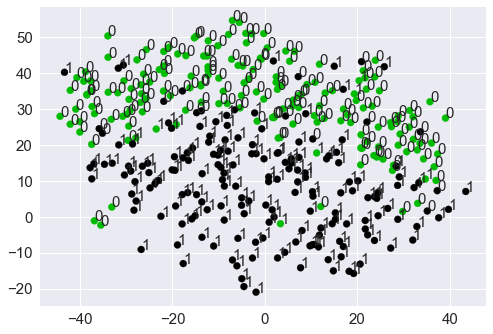

num of points  100 fore_nodes  51 back_nodes  49
Maximum flow is  0.7823181054071733 acc is  0.935933147632
kmeans acc  0.938718662953


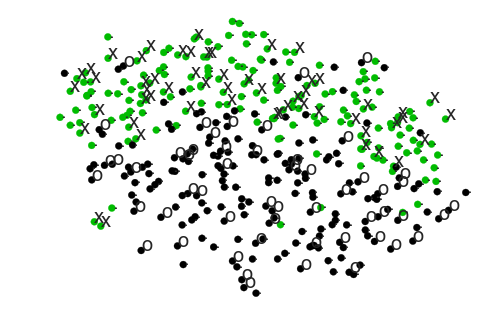

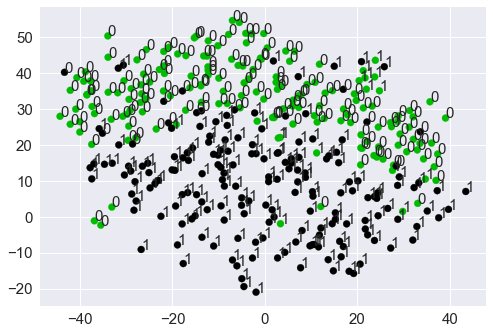

num of points  110 fore_nodes  56 back_nodes  54
Maximum flow is  0.7346077117015302 acc is  0.91643454039
kmeans acc  0.905292479109


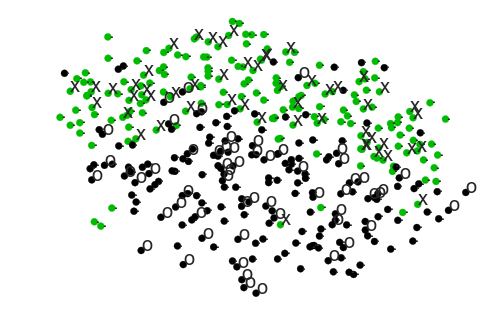

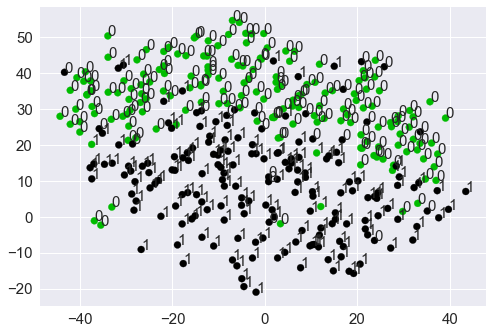

num of points  110 fore_nodes  52 back_nodes  58
Maximum flow is  0.7400776629315917 acc is  0.927576601671
kmeans acc  0.91364902507


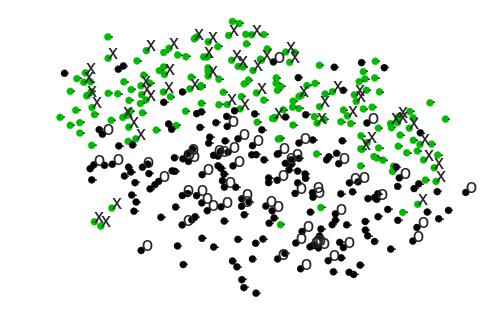

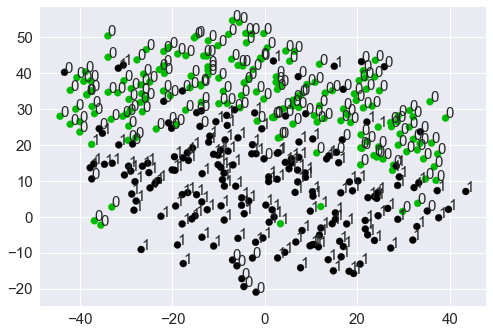

num of points  110 fore_nodes  53 back_nodes  57
Maximum flow is  0.7339365345395219 acc is  0.905292479109
kmeans acc  0.91364902507


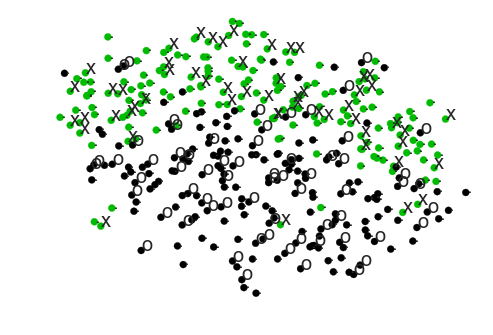

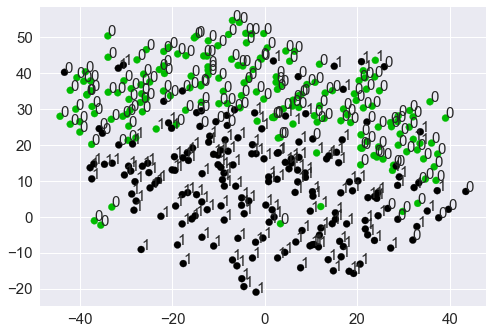

num of points  120 fore_nodes  55 back_nodes  65
Maximum flow is  0.7003923324866306 acc is  0.899721448468
kmeans acc  0.952646239554


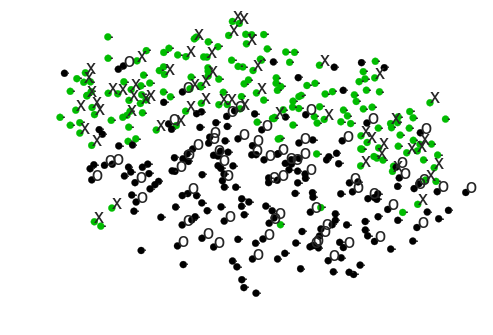

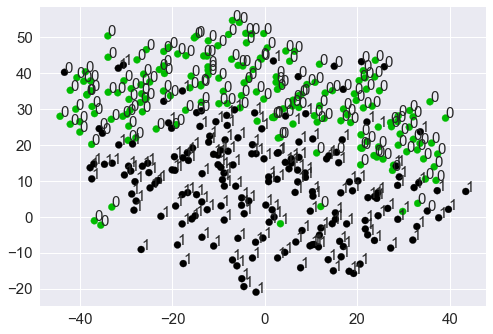

num of points  120 fore_nodes  56 back_nodes  64
Maximum flow is  0.7042989127183346 acc is  0.941504178273
kmeans acc  0.930362116992


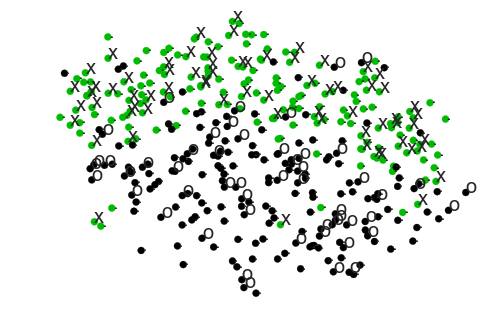

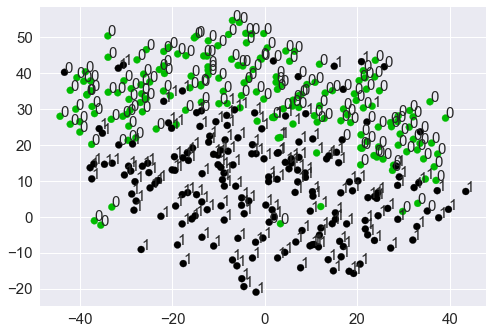

num of points  120 fore_nodes  68 back_nodes  52
Maximum flow is  0.7093440427469317 acc is  0.927576601671
kmeans acc  0.941504178273


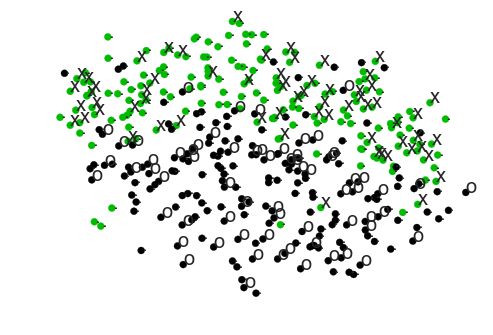

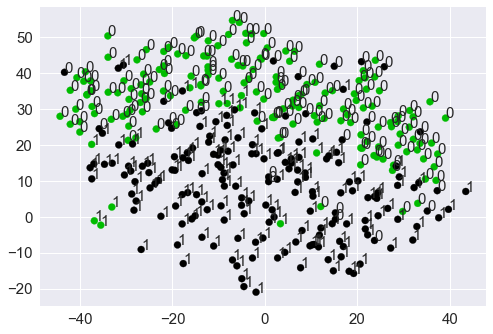

num of points  130 fore_nodes  64 back_nodes  66
Maximum flow is  0.6642222077609402 acc is  0.899721448468
kmeans acc  0.924791086351


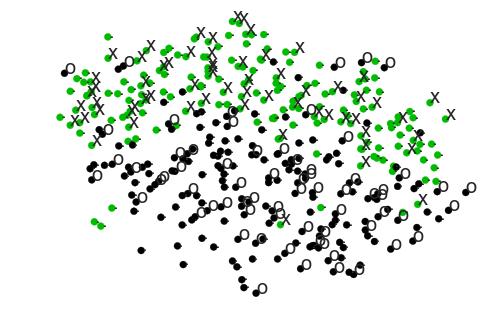

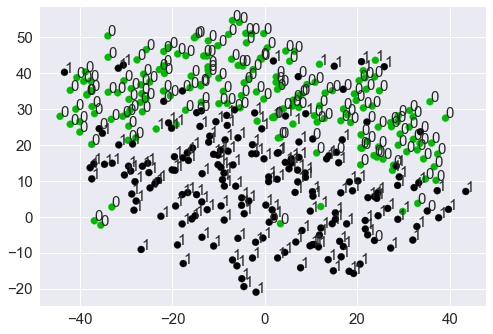

num of points  130 fore_nodes  63 back_nodes  67
Maximum flow is  0.659249062719618 acc is  0.924791086351
kmeans acc  0.935933147632


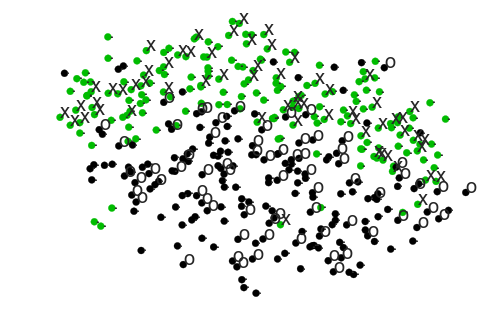

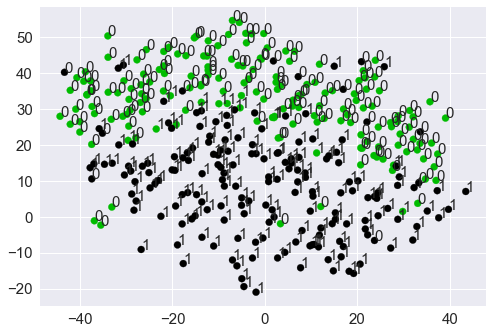

num of points  130 fore_nodes  61 back_nodes  69
Maximum flow is  0.6630282350830738 acc is  0.924791086351
kmeans acc  0.952646239554


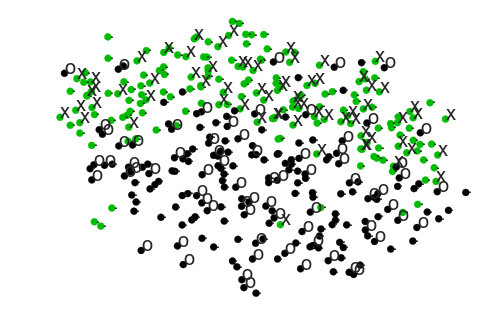

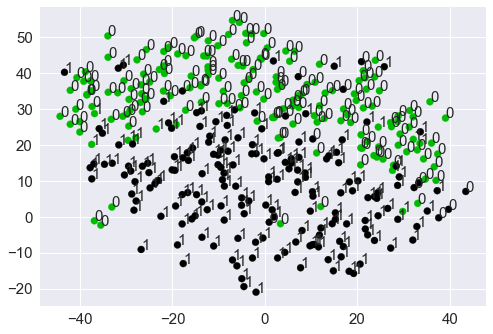

num of points  140 fore_nodes  68 back_nodes  72
Maximum flow is  0.6349941963359271 acc is  0.933147632312
kmeans acc  0.935933147632


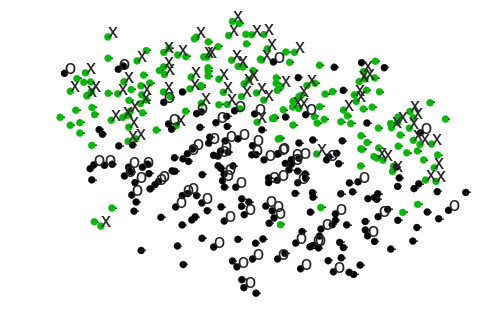

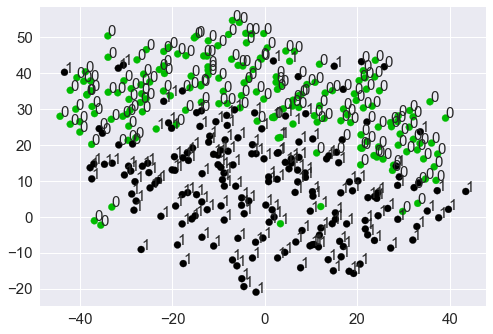

num of points  140 fore_nodes  73 back_nodes  67
Maximum flow is  0.6326341402187479 acc is  0.927576601671
kmeans acc  0.91643454039


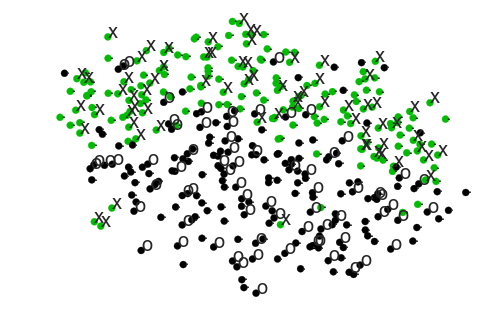

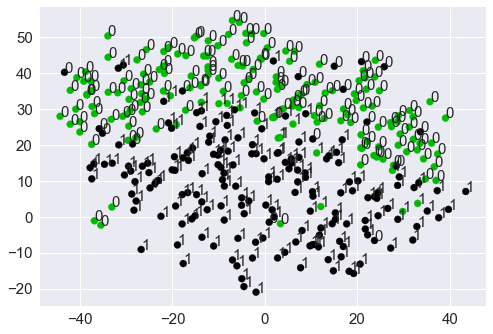

num of points  140 fore_nodes  70 back_nodes  70
Maximum flow is  0.6296180627528272 acc is  0.910863509749
kmeans acc  0.947075208914


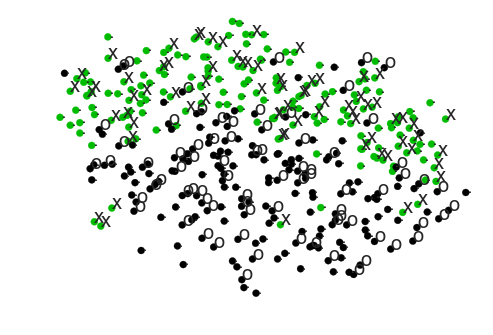

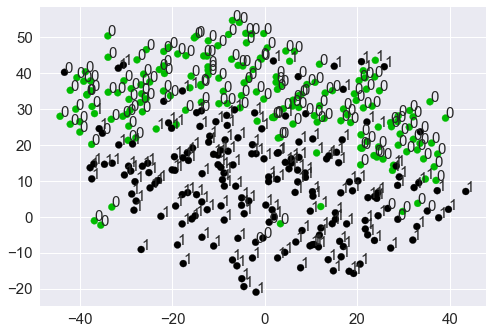

num of points  150 fore_nodes  73 back_nodes  77
Maximum flow is  0.5943711458326635 acc is  0.924791086351
kmeans acc  0.947075208914


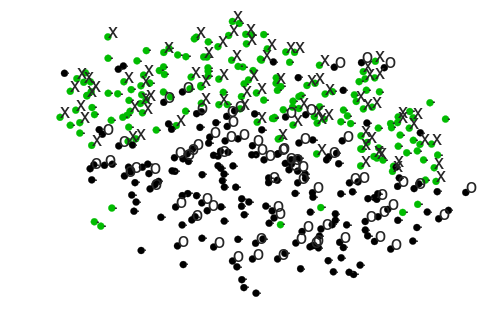

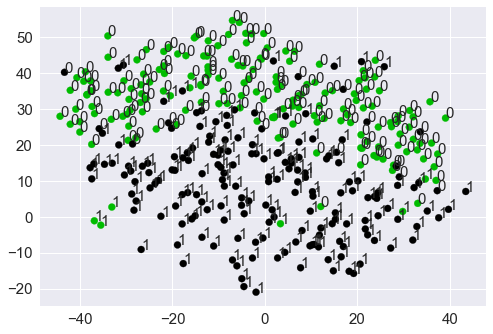

num of points  150 fore_nodes  78 back_nodes  72
Maximum flow is  0.5942264122796468 acc is  0.924791086351
kmeans acc  0.961002785515


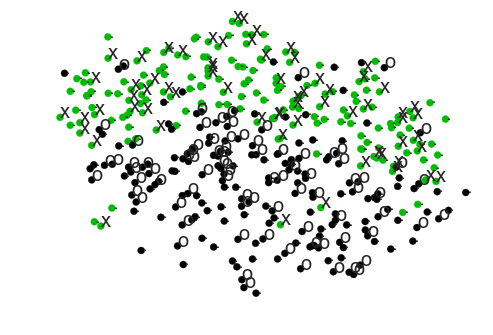

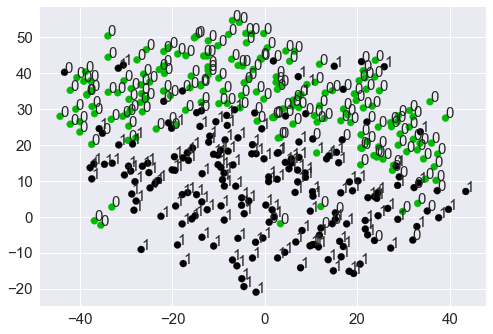

num of points  150 fore_nodes  66 back_nodes  84
Maximum flow is  0.5927869989195473 acc is  0.91364902507
kmeans acc  0.963788300836


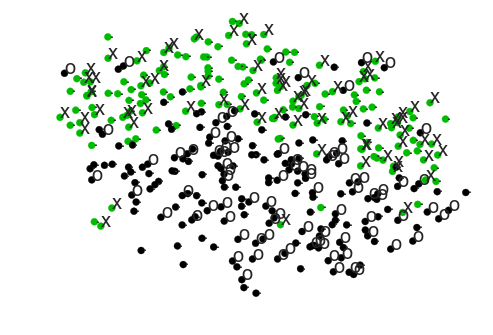

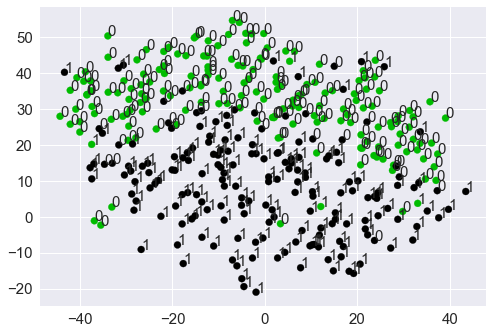

num of points  160 fore_nodes  77 back_nodes  83
Maximum flow is  0.5591241291523872 acc is  0.924791086351
kmeans acc  0.91364902507


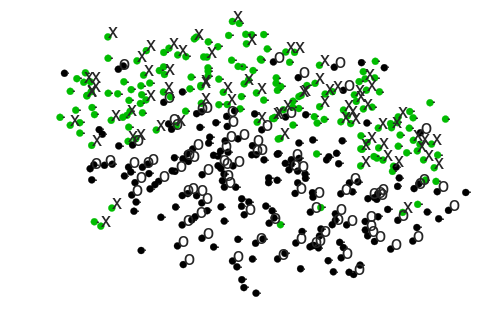

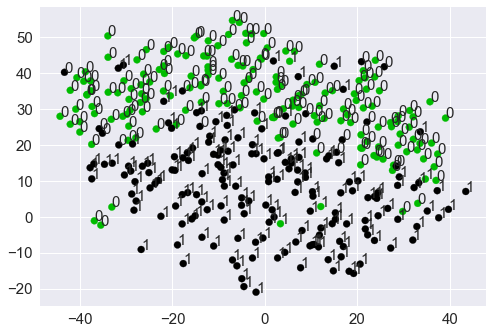

num of points  160 fore_nodes  74 back_nodes  86
Maximum flow is  0.5650209595169248 acc is  0.944289693593
kmeans acc  0.930362116992


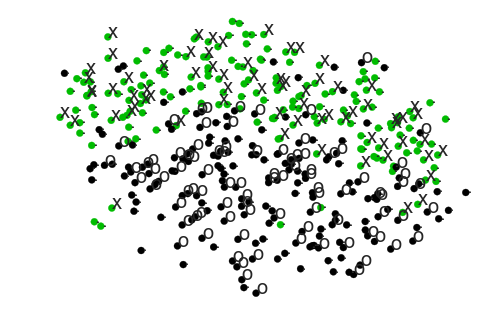

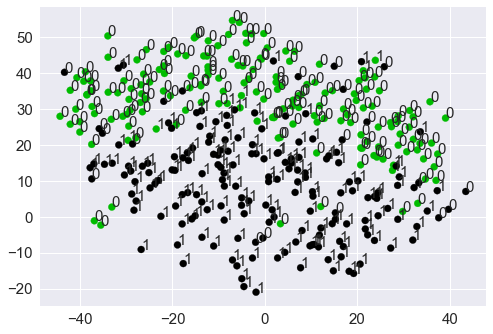

num of points  160 fore_nodes  70 back_nodes  90
Maximum flow is  0.5611605519246828 acc is  0.91364902507
kmeans acc  0.944289693593


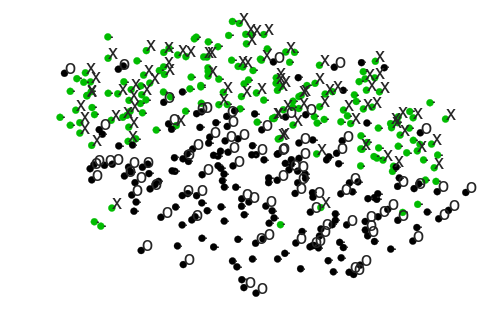

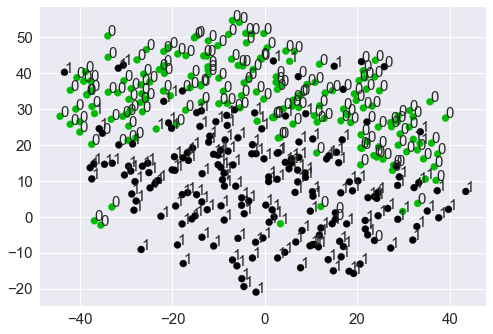

num of points  170 fore_nodes  85 back_nodes  85
Maximum flow is  0.5291592529140868 acc is  0.935933147632
kmeans acc  0.947075208914


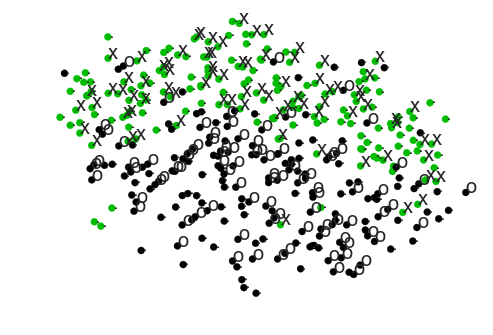

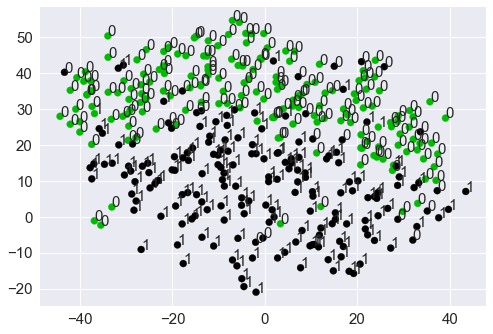

num of points  170 fore_nodes  80 back_nodes  90
Maximum flow is  0.5256694685079559 acc is  0.927576601671
kmeans acc  0.955431754875


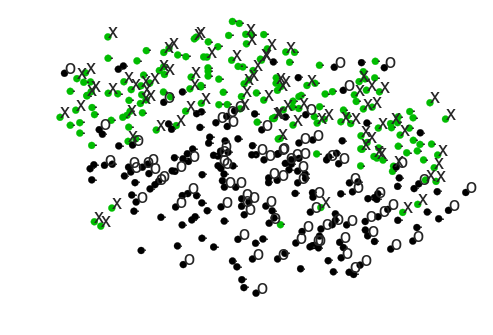

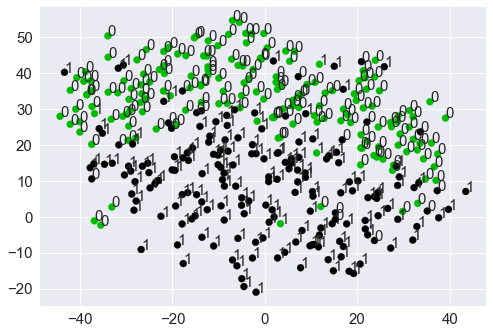

num of points  170 fore_nodes  85 back_nodes  85
Maximum flow is  0.5228817649626931 acc is  0.930362116992
kmeans acc  0.955431754875


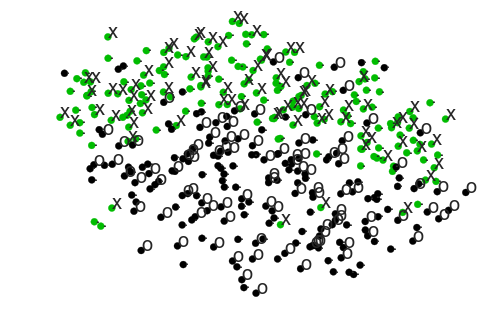

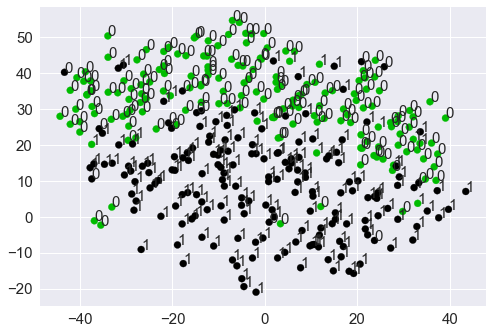

num of points  180 fore_nodes  84 back_nodes  96
Maximum flow is  0.4934549881966902 acc is  0.927576601671
kmeans acc  0.952646239554


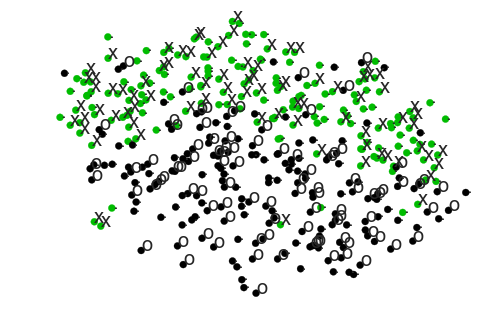

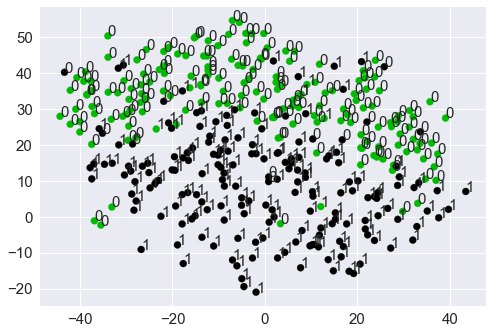

num of points  180 fore_nodes  85 back_nodes  95
Maximum flow is  0.49718483066363545 acc is  0.947075208914
kmeans acc  0.952646239554


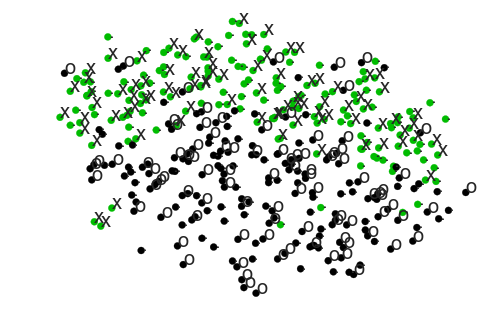

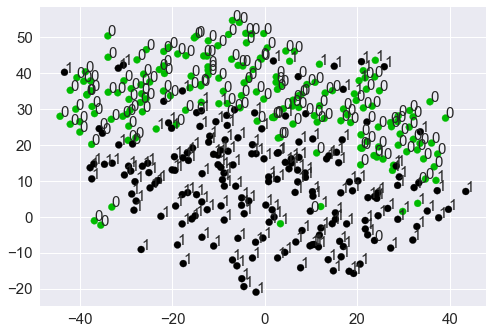

num of points  180 fore_nodes  87 back_nodes  93
Maximum flow is  0.49179314558917636 acc is  0.91643454039
kmeans acc  0.938718662953


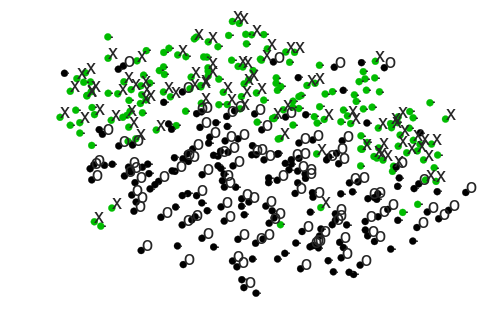

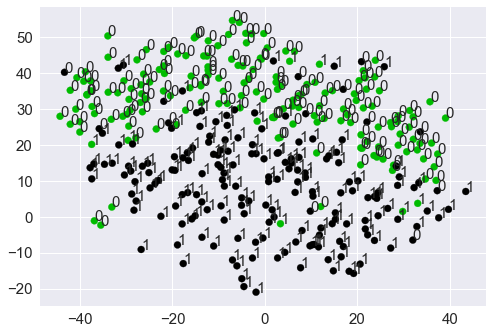

num of points  190 fore_nodes  85 back_nodes  105
Maximum flow is  0.4599869984651397 acc is  0.935933147632
kmeans acc  0.952646239554


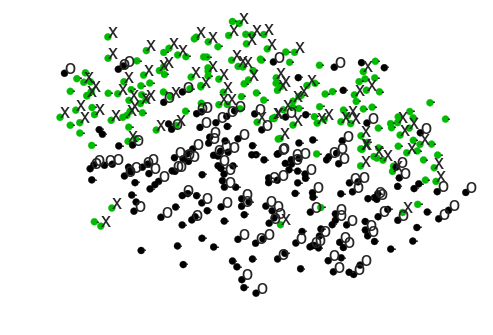

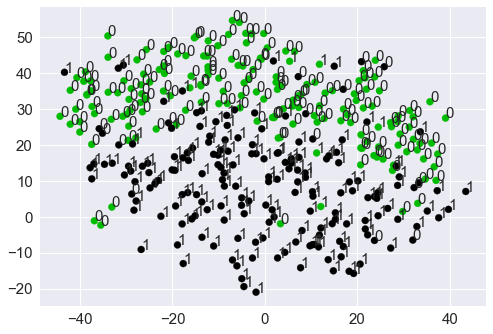

num of points  190 fore_nodes  85 back_nodes  105
Maximum flow is  0.46907059235590637 acc is  0.935933147632
kmeans acc  0.958217270195


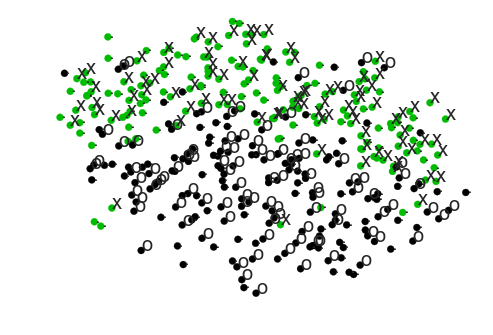

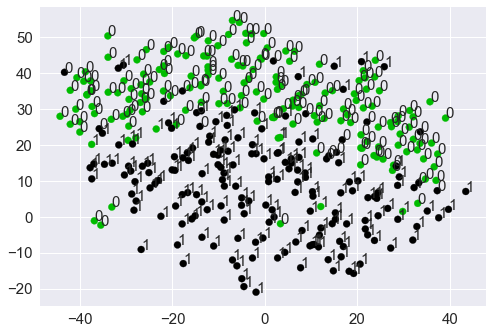

num of points  190 fore_nodes  91 back_nodes  99
Maximum flow is  0.4655777741078739 acc is  0.933147632312
kmeans acc  0.961002785515


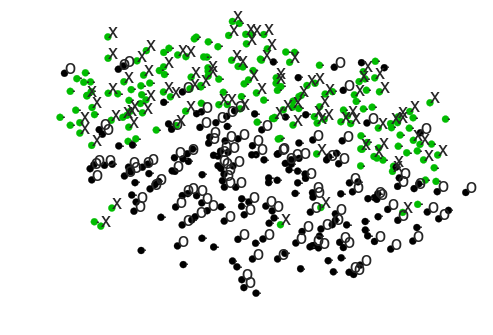

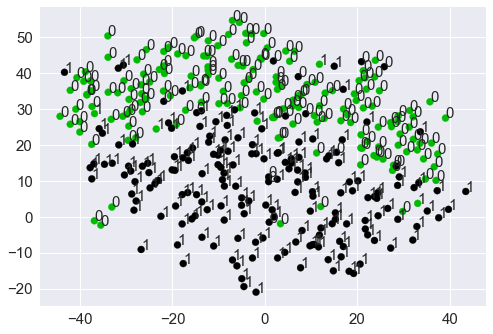

num of points  200 fore_nodes  90 back_nodes  110
Maximum flow is  0.4327280437032471 acc is  0.949860724234
kmeans acc  0.966573816156


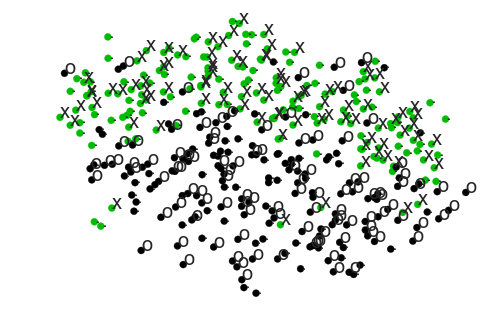

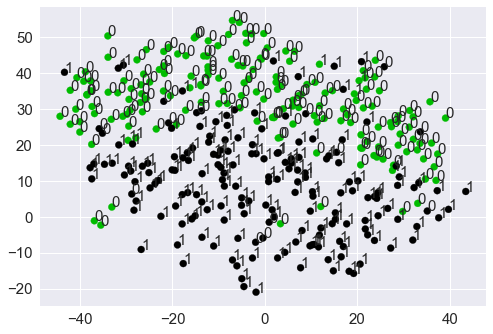

num of points  200 fore_nodes  94 back_nodes  106
Maximum flow is  0.4335880695597048 acc is  0.935933147632
kmeans acc  0.952646239554


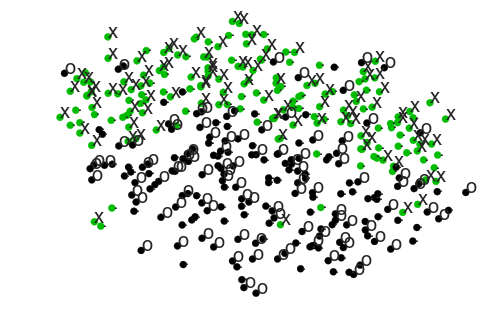

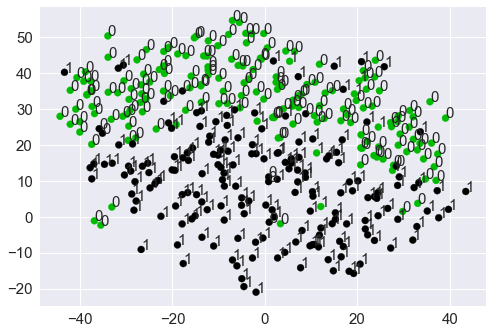

num of points  200 fore_nodes  100 back_nodes  100
Maximum flow is  0.4284718909423447 acc is  0.949860724234
kmeans acc  0.958217270195


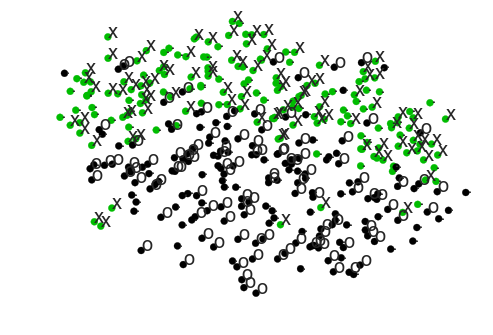

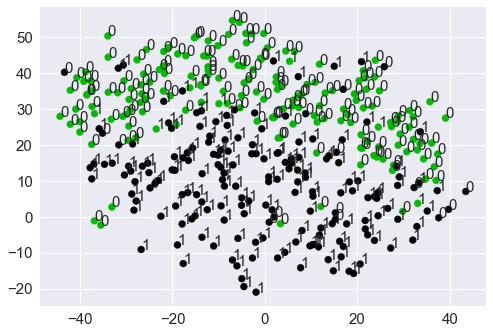

num of points  210 fore_nodes  101 back_nodes  109
Maximum flow is  0.39407916250444164 acc is  0.930362116992
kmeans acc  0.958217270195


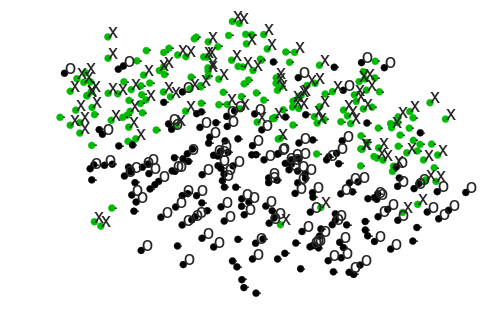

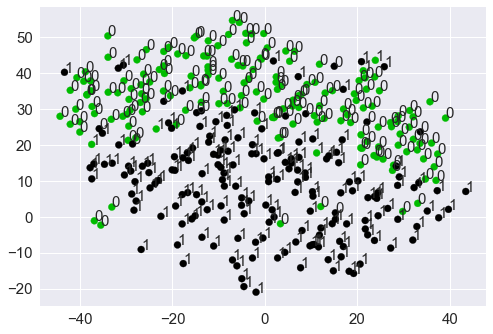

num of points  210 fore_nodes  99 back_nodes  111
Maximum flow is  0.3941043977815808 acc is  0.955431754875
kmeans acc  0.974930362117


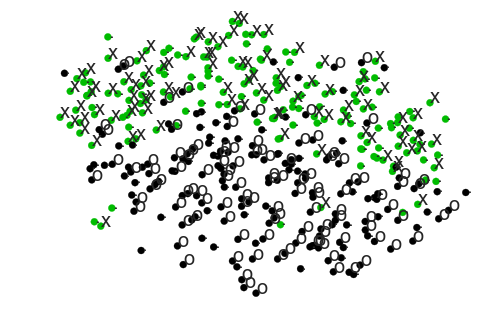

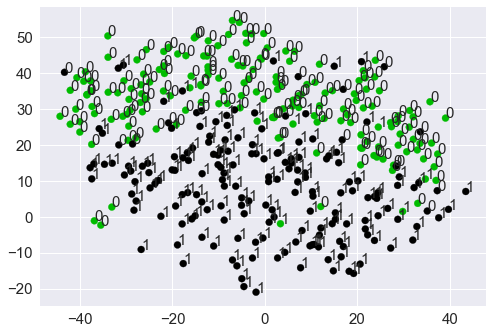

num of points  210 fore_nodes  97 back_nodes  113
Maximum flow is  0.3982357072988104 acc is  0.938718662953
kmeans acc  0.963788300836


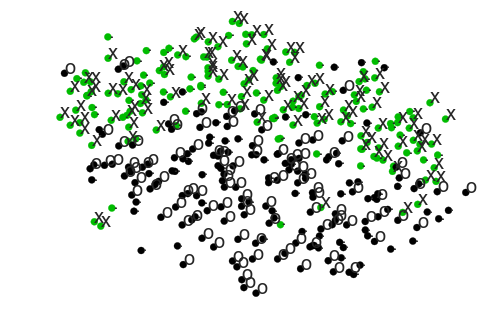

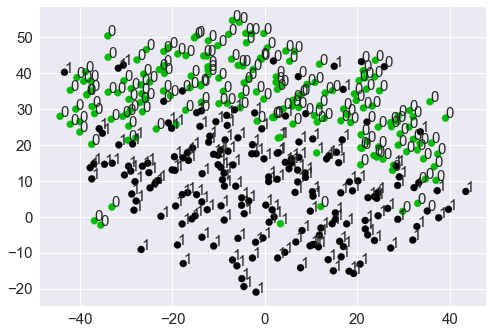

num of points  220 fore_nodes  111 back_nodes  109
Maximum flow is  0.3615186275620232 acc is  0.949860724234
kmeans acc  0.974930362117


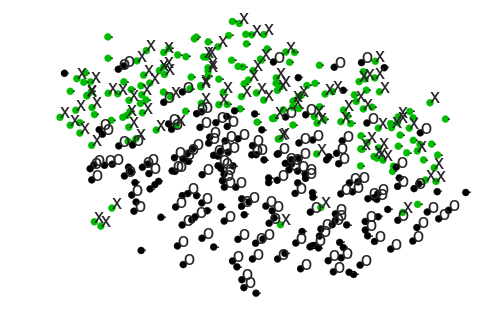

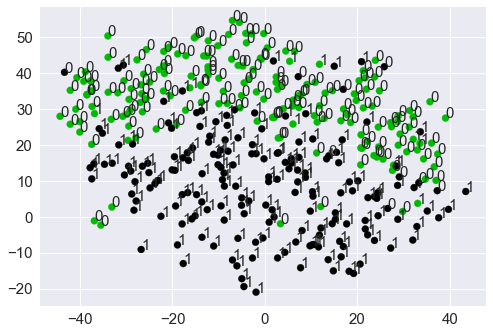

num of points  220 fore_nodes  94 back_nodes  126
Maximum flow is  0.374781302617113 acc is  0.944289693593
kmeans acc  0.974930362117


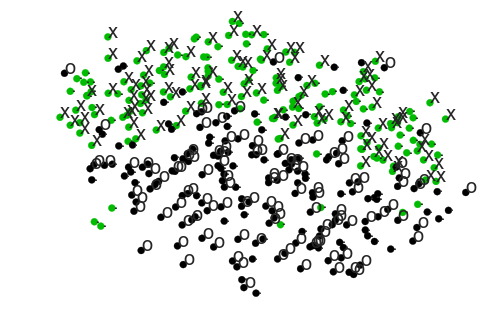

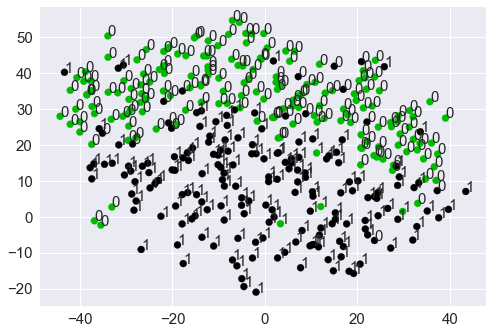

num of points  220 fore_nodes  105 back_nodes  115
Maximum flow is  0.36536759246022543 acc is  0.947075208914
kmeans acc  0.949860724234


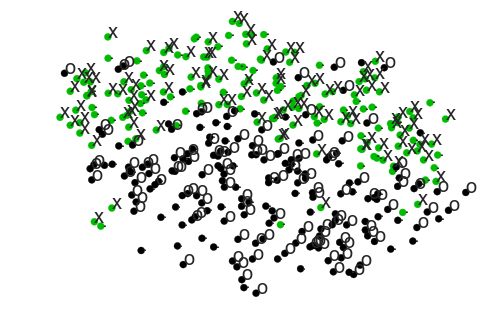

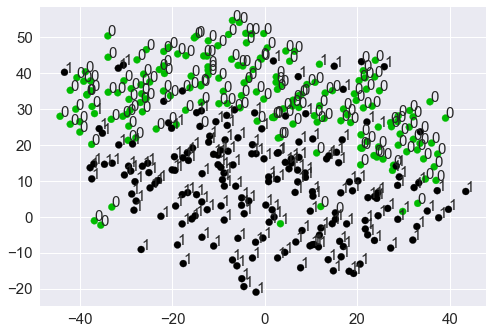

num of points  230 fore_nodes  111 back_nodes  119
Maximum flow is  0.343016371232862 acc is  0.955431754875
kmeans acc  0.972144846797


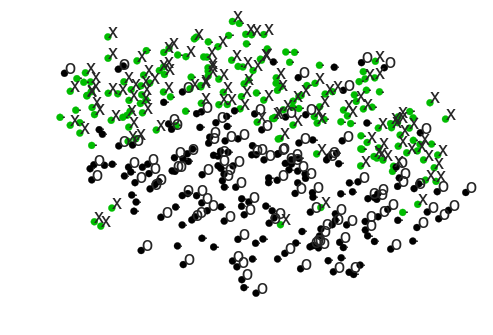

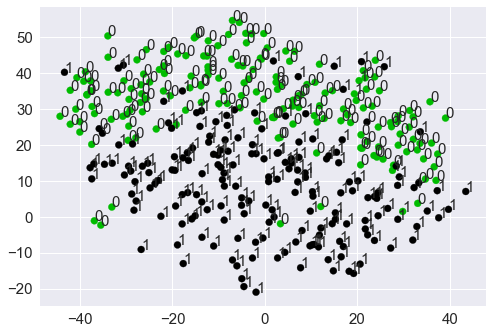

num of points  230 fore_nodes  119 back_nodes  111
Maximum flow is  0.3448669100583518 acc is  0.972144846797
kmeans acc  0.963788300836


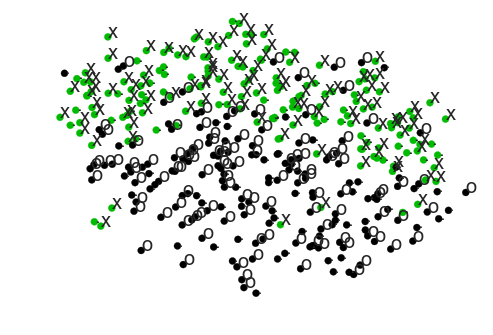

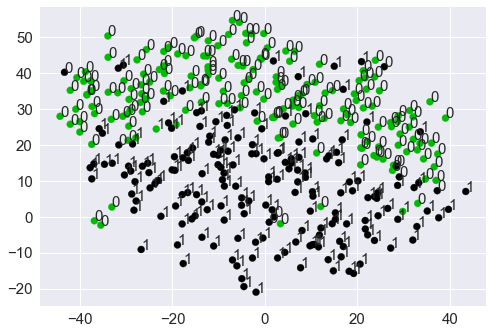

num of points  230 fore_nodes  115 back_nodes  115
Maximum flow is  0.3433324138320083 acc is  0.966573816156
kmeans acc  0.972144846797


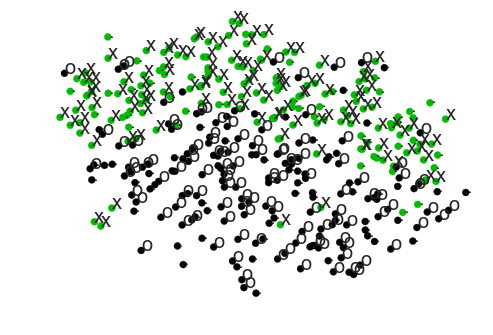

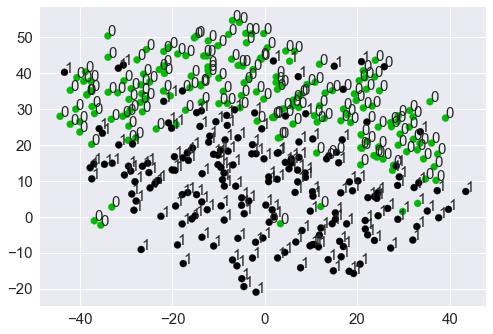

num of points  240 fore_nodes  124 back_nodes  116
Maximum flow is  0.31270948177629154 acc is  0.958217270195
kmeans acc  0.963788300836


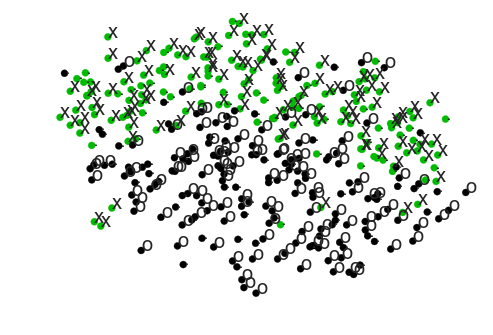

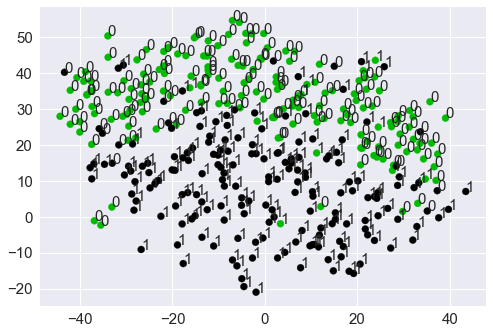

num of points  240 fore_nodes  116 back_nodes  124
Maximum flow is  0.31660695146611423 acc is  0.927576601671
kmeans acc  0.955431754875


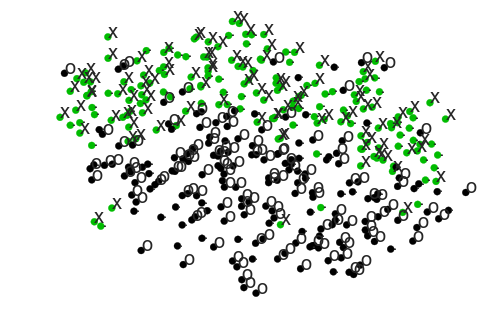

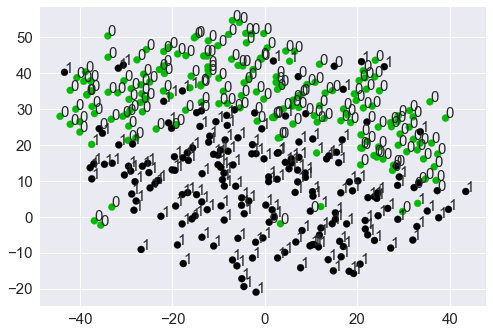

num of points  240 fore_nodes  107 back_nodes  133
Maximum flow is  0.31328851911242706 acc is  0.938718662953
kmeans acc  0.974930362117


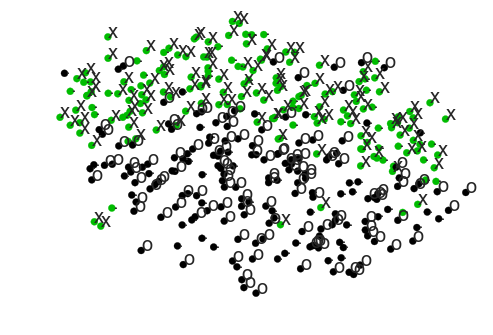

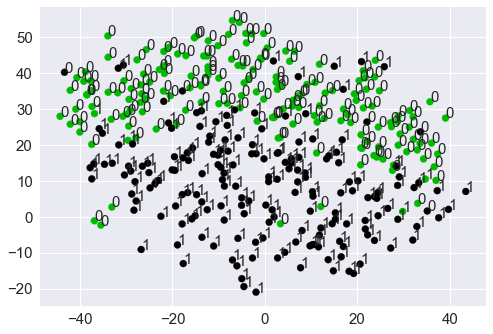

num of points  250 fore_nodes  123 back_nodes  127
Maximum flow is  0.2902167280277712 acc is  0.972144846797
kmeans acc  0.980501392758


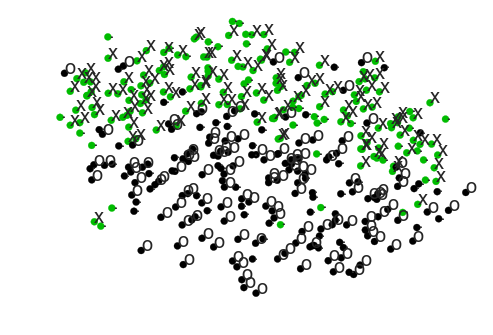

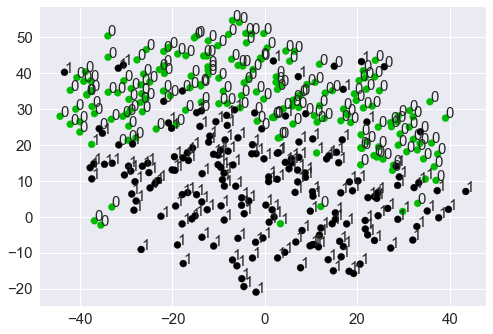

num of points  250 fore_nodes  128 back_nodes  122
Maximum flow is  0.2784456660312629 acc is  0.955431754875
kmeans acc  0.966573816156


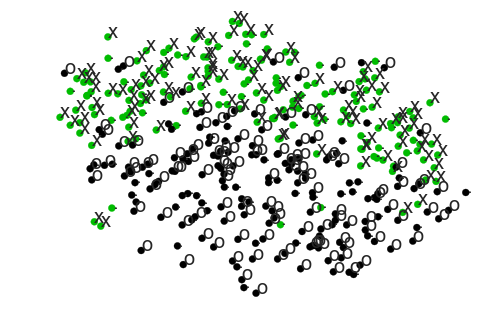

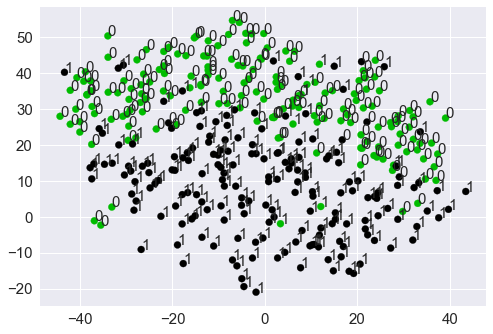

num of points  250 fore_nodes  121 back_nodes  129
Maximum flow is  0.2882176346540424 acc is  0.958217270195
kmeans acc  0.974930362117


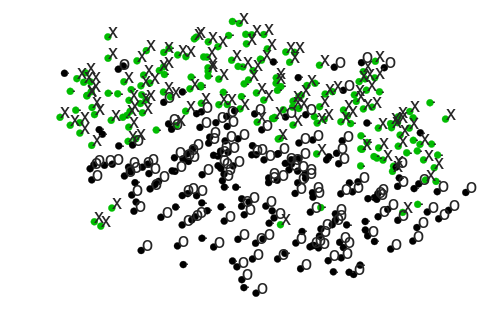

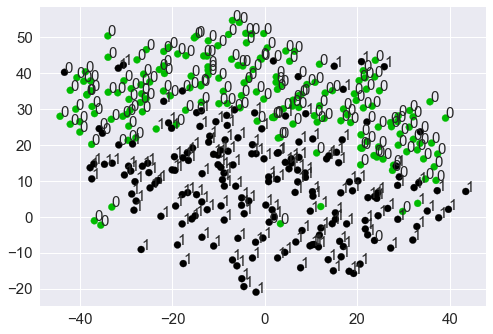

num of points  260 fore_nodes  124 back_nodes  136
Maximum flow is  0.2562881547824867 acc is  0.952646239554
kmeans acc  0.977715877437


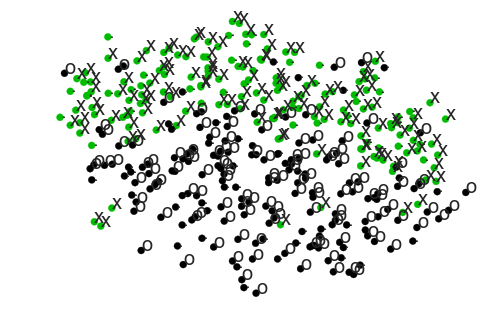

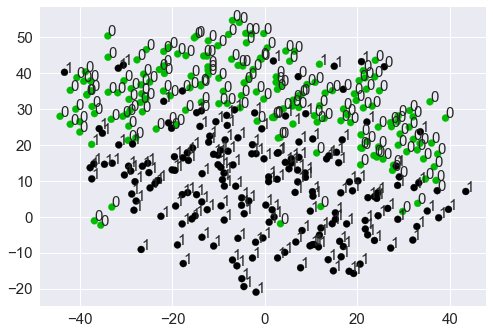

num of points  260 fore_nodes  132 back_nodes  128
Maximum flow is  0.24839253246875154 acc is  0.966573816156
kmeans acc  0.974930362117


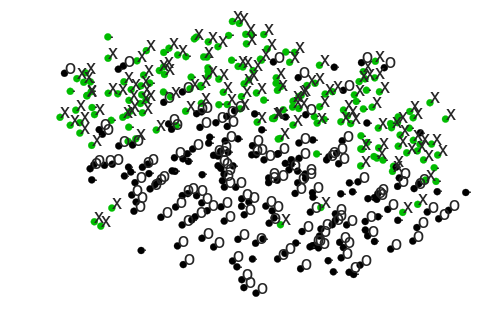

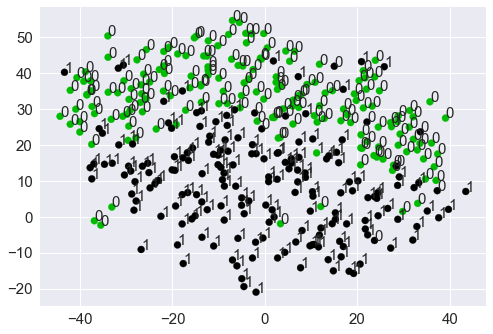

num of points  260 fore_nodes  128 back_nodes  132
Maximum flow is  0.2513491555306249 acc is  0.966573816156
kmeans acc  0.974930362117


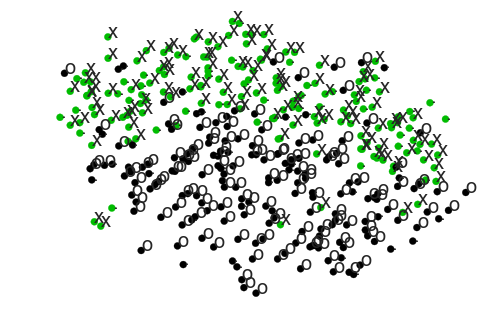

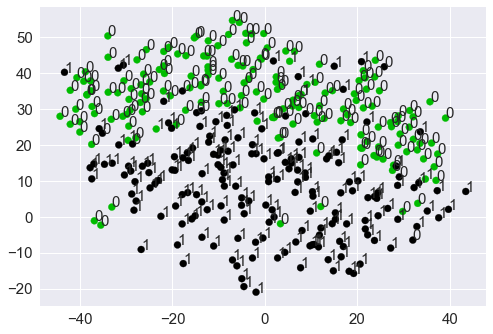

num of points  270 fore_nodes  124 back_nodes  146
Maximum flow is  0.22226959229444732 acc is  0.952646239554
kmeans acc  0.969359331476


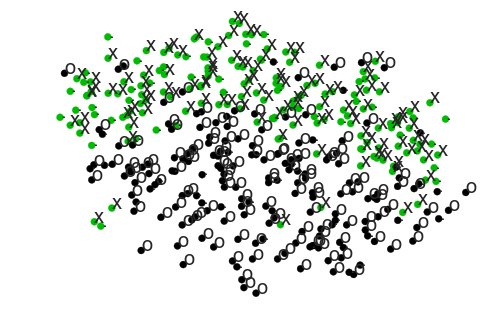

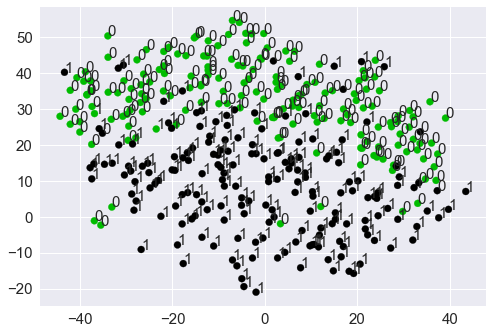

num of points  270 fore_nodes  125 back_nodes  145
Maximum flow is  0.23207421620495655 acc is  0.972144846797
kmeans acc  0.977715877437


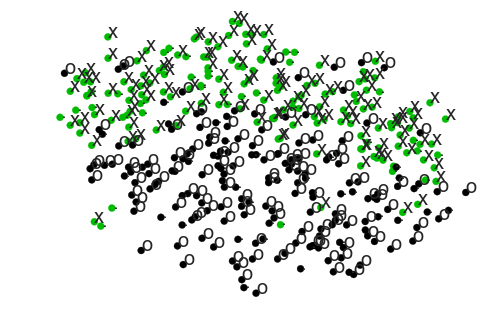

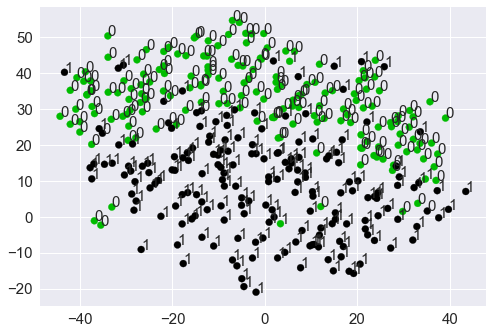

num of points  270 fore_nodes  133 back_nodes  137
Maximum flow is  0.2386381655171072 acc is  0.977715877437
kmeans acc  0.988857938719


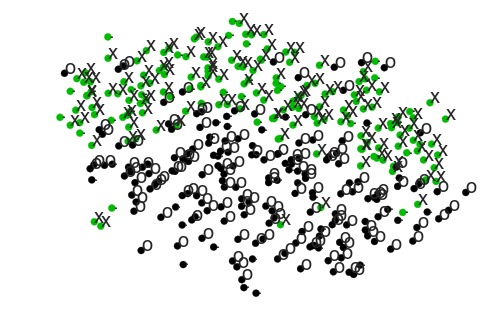

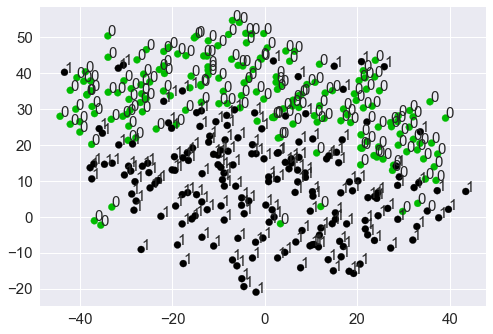

num of points  280 fore_nodes  136 back_nodes  144
Maximum flow is  0.2049792467706746 acc is  0.980501392758
kmeans acc  0.983286908078


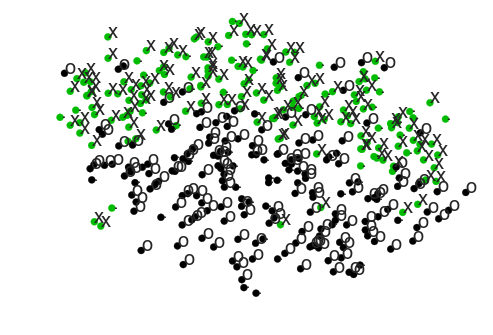

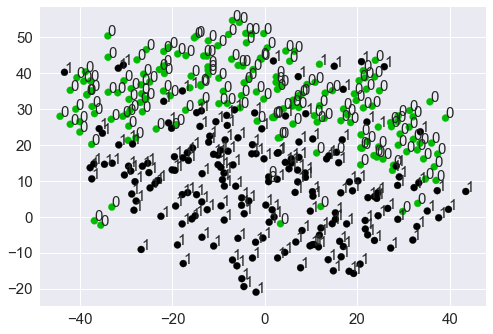

num of points  280 fore_nodes  132 back_nodes  148
Maximum flow is  0.21336818375873437 acc is  0.974930362117
kmeans acc  0.977715877437


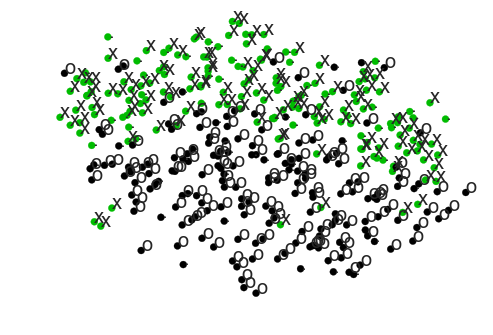

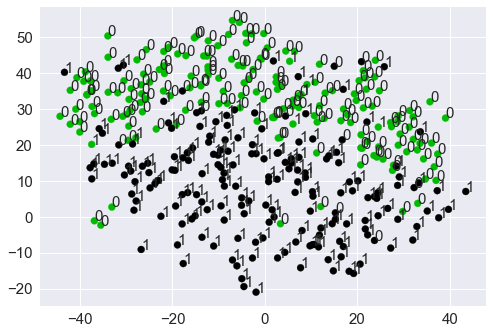

num of points  280 fore_nodes  129 back_nodes  151
Maximum flow is  0.1985757660798645 acc is  0.952646239554
kmeans acc  0.986072423398


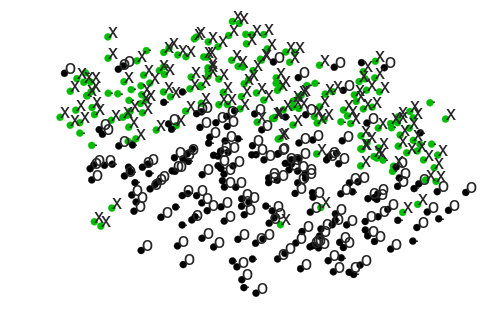

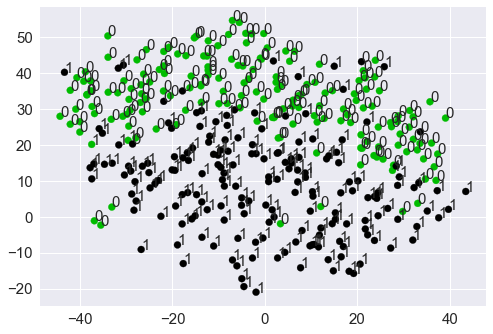

num of points  290 fore_nodes  147 back_nodes  143
Maximum flow is  0.18084905071187293 acc is  0.969359331476
kmeans acc  0.977715877437


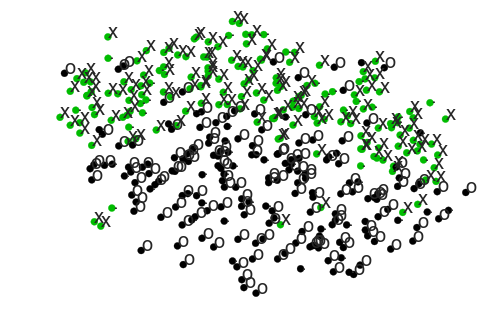

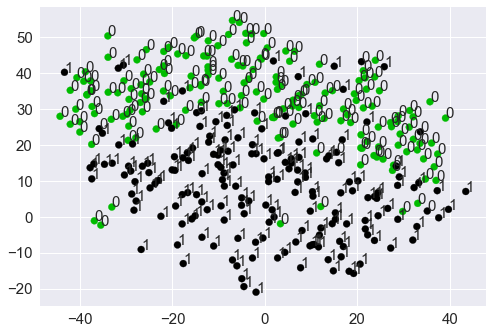

num of points  290 fore_nodes  146 back_nodes  144
Maximum flow is  0.18011235754830085 acc is  0.980501392758
kmeans acc  0.986072423398


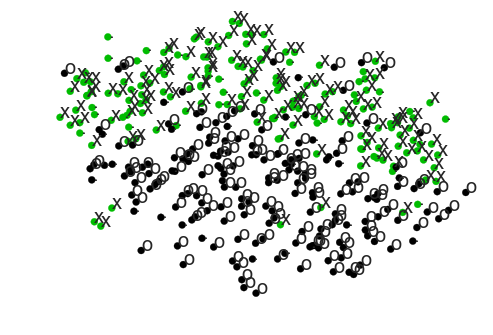

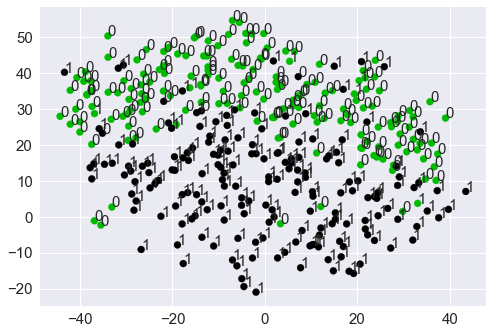

num of points  290 fore_nodes  138 back_nodes  152
Maximum flow is  0.18261019811301343 acc is  0.966573816156
kmeans acc  0.994428969359


In [53]:
sample_num = np.arange(20, 300, 10)
iter_num = 3

is_graph_step = True
fig_sample_list = []
fig_result_list = []
acc_graph_list = []
acc_kmeans_list = []
flow_list = []
slopes = [1,0.5,0,-0.5,-1,99999999]


for sn in sample_num:
    #fore_node = np.random.permutation(L_limit)[:sample_num]
    #back_node = (np.random.permutation(data_num-L_limit)+L_limit)[:sample_num]

    #fore_node = np.random.permutation(data_num)[:sample_num]
    #back_node = np.random.permutation(data_num)[:sample_num]

    #kmeans_labels = seqh.classify_with_Kmeans(F_reduced, L)
    #all_node = set([i for i in range(data_num)])
    #fore_node = np.nonzero(kmeans_labels )[0]
    #back_node = np.array(list(all_node.difference(set(fore_node))))    
    #fore_node = np.random.permutation(fore_node)[:sample_num]
    #back_node = np.random.permutation(back_node)[:sample_num]
    #fore_node, back_node = get_divide_points(F_reduced, L, slope, sample_num)
    acc_max_graph = -1
    acc_max_kmeans = -1
    for iter_i in range(iter_num):
    
        fore_node = []
        back_node = []
        sampled_points = np.random.permutation(data_num)[:sn]
        fore_node = sampled_points[np.nonzero(L[sampled_points])]    
        back_node = list(set(sampled_points).difference(set(fore_node)))

        color_list = np.array(['.' for i in range(data_num)])
        color_list[fore_node] = 'x'
        color_list[back_node] = 'o'

        fig, ax = plt.subplots()
        c=[spectral(float(i) /nc) for i in L]
        ax.scatter(F_reduced[:,0],F_reduced[:,1], c=c)
        txt = [str(i) for i in color_list] #[label_text_dict[i] for i in label]
        for i in range(data_num):
            ax.annotate(txt[i], (F_reduced[i,0],F_reduced[i,1]),size=20)
        plt.axis('off')
        if is_graph_step:
            plt.show()

        fig_sample_list.append(fig)    


        ####################### define region cost
        bin_size = 5
        x_max, x_min = np.max(F_reduced[:,0]), np.min(F_reduced[:,0])
        y_max, y_min = np.max(F_reduced[:,1]), np.min(F_reduced[:,1])
        #print(x_max, x_min, y_max, y_min)
        x_list = [x_min+i*bin_size for i in range(1+math.ceil(( x_max-x_min)/5))]
        y_list = [y_min+i*bin_size for i in range(1+math.ceil(( y_max-y_min)/5))]

        fore_hist, xedges, yedges = np.histogram2d(F_reduced[fore_node][:,0], F_reduced[fore_node][:,1], bins=(x_list, y_list))
        fore_pmf = (fore_hist + 1)/(np.sum(fore_hist)+fore_hist.shape[0]*fore_hist.shape[1] )
        back_hist, xedges, yedges = np.histogram2d(F_reduced[back_node][:,0], F_reduced[back_node][:,1], bins=(x_list, y_list))
        back_pmf = (back_hist + 1)/(np.sum(back_hist)+back_hist.shape[0]*back_hist.shape[1] )


        fore_region_cost = []
        back_region_cost = []
        s_link_list = []
        t_link_list = []

        for i in range(data_num):
            p = F_reduced[i,:]

            fore_c = seqh.get_prob_from_prob_bin(p[0],p[1], fore_pmf, xedges, yedges)
            back_c = seqh.get_prob_from_prob_bin(p[0],p[1], back_pmf, xedges, yedges)    
            s_link_list.append(fore_c)
            t_link_list.append(back_c)

            if is_add_hard_constraint:
                if i in fore_node:
                    fore_c = K_upper_limit  
                    back_c = 0
                elif i in back_node:
                    fore_c = 0
                    back_c = K_upper_limit             


            fore_region_cost.append(fore_c)
            back_region_cost.append(back_c)

        fore_region_cost = np.array(fore_region_cost)
        back_region_cost = np.array(back_region_cost)
        s_link_list = np.array(s_link_list)
        t_link_list = np.array(t_link_list)

        ###########             Define edge cost
        P_tr_map, P_neighbor_index = seqh.get_N_neighbor(P_map, N_neighbor)
        P_tr_map = P_tr_map*lamb

        np.max(P_tr_map),np.max(s_link_list),np.max(t_link_list)


        ########################### Create a graph with float capacities.
        g = maxflow.Graph[float](data_num+2, N_neighbor*(data_num+2))
        nodes = g.add_nodes(data_num)
        for i in range(data_num):    
            neighbor_index = P_neighbor_index[i]
            for j in neighbor_index:
                g.add_edge(nodes[i], nodes[j], P_tr_map[i,j], P_tr_map[j,i])        
            g.add_tedge(nodes[i], fore_region_cost[i], back_region_cost[i])

        flow = g.maxflow()
        flow_list.append(flow)

        A = []
        for i in range(data_num):
            a = g.get_segment(nodes[i])
            A.append(a)

        fig, ax = plt.subplots()
        c=[spectral(float(i) /nc) for i in L]
        ax.scatter(F_reduced[:,0],F_reduced[:,1], c=c)
        txt = [str(i) for i in A] #[label_text_dict[i] for i in label]
        for i in range(data_num):
            ax.annotate(txt[i], (F_reduced[i,0],F_reduced[i,1]),size=15)
        if is_graph_step:
            plt.show()

        fig_result_list.append(fig)
        acc, lumping_error, splitting_error = seqh.evaluate_performance(L,A)            
        
        if acc_max_graph<acc:
            acc_max_graph = acc
        
        if is_graph_step:
            print('num of points ', sn, 'fore_nodes ', len(fore_node),'back_nodes ', len(back_node))
            print("Maximum flow is ", flow, 'acc is ',acc) 

        if np.sum(np.array(A)) > data_num*2/3 or np.sum(np.array(A)) < data_num/3:
            fig_sample_list = fig_sample_list[:-1]
            fig_result_list = fig_result_list[:-1]
            acc_list = acc_list[:-1]
            flow_list = flow_list[:-1]

        # with Kmeans
        init = np.vstack((F[fore_node],F[back_node]))
        kmeans =KMeans(init.shape[0],init=init).fit(F)
        pred_labels = kmeans.labels_<len(fore_node)
        acc,lump,split = seqh.evaluate_performance(L, pred_labels)
        print('kmeans acc ', acc)
        if acc_max_kmeans<acc:
            acc_max_kmeans = acc
            
    acc_graph_list.append(acc_max_graph)
    acc_kmeans_list.append(acc_max_kmeans)

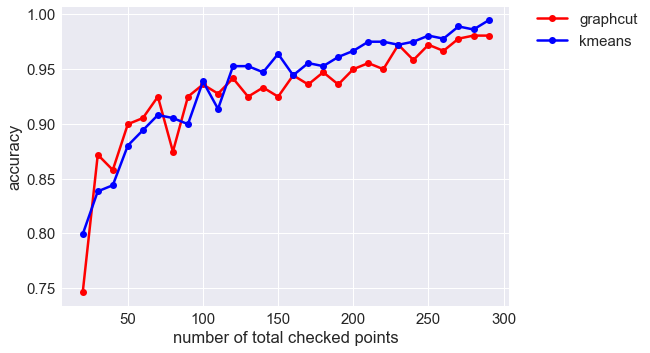

In [55]:
plt.plot(sample_num, acc_graph_list,'ro-',label='graphcut') 
plt.plot(sample_num, acc_kmeans_list,'bo-', label='kmeans')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlabel('number of total checked points')
plt.ylabel('accuracy')
plt.show()

Maximum flow is  1.91991256674 acc is  0.771587743733 18


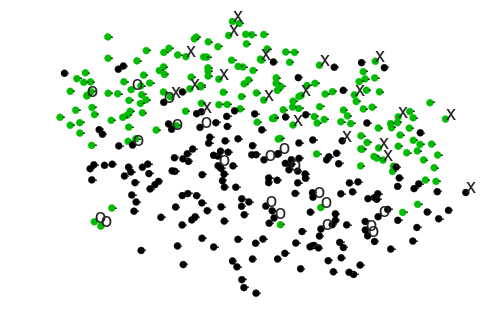

In [109]:
flow_list = np.array(flow_list)
best_i = np.argmax(flow_list)
print("Maximum flow is ", flow_list[best_i], 'acc is ',acc_list[best_i],best_i)
fig_sample_list[best_i]

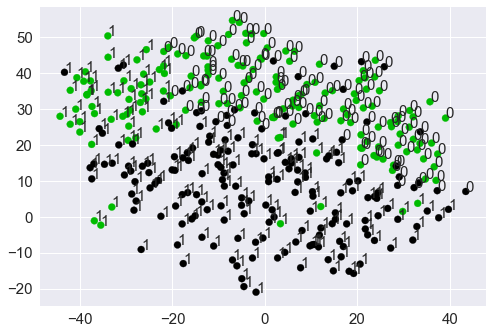

In [110]:
fig_result_list[best_i]

Maximum flow is  1.46172958481 acc is  0.515320334262 28


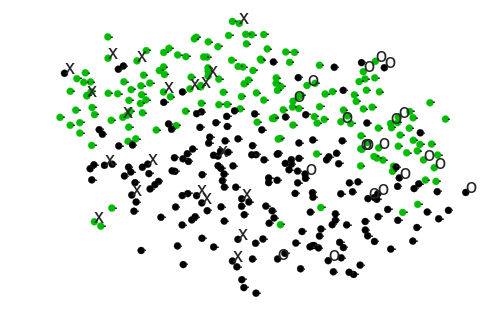

In [111]:
flow_list = np.array(flow_list)
best_i = np.argmin(flow_list)
print("Maximum flow is ", flow_list[best_i], 'acc is ',acc_list[best_i],best_i)
fig_sample_list[best_i]

In [41]:
def get_divide_points(F_reduced, L, slope, sample_num):
    F_median_x, F_median_y = np.median(F_reduced,axis=0)
    
    F_reduced_x = F_reduced[:,0]
    F_reduced_y = F_reduced[:,1]
    F_bound_y = (F_reduced_x+F_median_x)*slope + F_median_y

    fore_node = np.nonzero(F_reduced_y >F_bound_y)[0]
    back_node = np.nonzero(F_reduced_y <= F_bound_y)[0]

    fore_node = np.random.permutation(fore_node)[:sample_num]
    back_node = np.random.permutation(back_node)[:sample_num]
    return fore_node, back_node

(None, None)

In [ ]:
F_path_name = ''.join(['./matrix_data/','SIMLR_F.csv'])
F_reduced = np.array(pd.read_csv(F_path_name,sep=",", header = None))
print(F_reduced.shape)
fig, ax = plt.subplots()
c=[spectral(float(i) /nc) for i in L]
ax.scatter(F_reduced[:,0],F_reduced[:,1], c=c)

txt = [str(i) for i in range(data_num)] #[label_text_dict[i] for i in label]
for i in range(data_num):
    ax.annotate(txt[i], (F_reduced[i,0],F_reduced[i,1]),size=9)
plt.show()